In [0]:
#install necessary packages
%pip install category_encoders

Python interpreter will be restarted.
Collecting category_encoders
 Downloading category_encoders-2.3.0-py2.py3-none-any.whl (82 kB)
Requirement already satisfied: numpy>=1.14.0 in /databricks/python3/lib/python3.8/site-packages (from category_encoders) (1.19.2)
Requirement already satisfied: pandas>=0.21.1 in /databricks/python3/lib/python3.8/site-packages (from category_encoders) (1.2.4)
Requirement already satisfied: patsy>=0.5.1 in /databricks/python3/lib/python3.8/site-packages (from category_encoders) (0.5.1)
Requirement already satisfied: statsmodels>=0.9.0 in /databricks/python3/lib/python3.8/site-packages (from category_encoders) (0.12.2)
Requirement already satisfied: scipy>=1.0.0 in /databricks/python3/lib/python3.8/site-packages (from category_encoders) (1.6.2)
Requirement already satisfied: scikit-learn>=0.20.0 in /databricks/python3/lib/python3.8/site-packages (from category_encoders) (0.24.1)
Requirement already satisfied: pytz>=2017.3 in /databricks/python3/lib/python3.8/site-packages (from pandas>=0.21.1->category_encoders) (2020.5)
Requirement already satisfied: python-dateutil>=2.7.3 in /databricks/python3/lib/python3.8/site-packages (from pandas>=0.21.1->category_encoders) (2.8.1)
Requirement already satisfied: six in /databricks/python3/lib/python3.8/site-packages (from patsy>=0.5.1->category_encoders) (1.15.0)
Requirement already satisfied: joblib>=0.11 in /databricks/python3/lib/python3.8/site-packages (from scikit-learn>=0.20.0->category_encoders) (1.0.1)
Requirement already satisfied: threadpoolctl>=2.0.0 in /databricks/python3/lib/python3.8/site-packages (from scikit-learn>=0.20.0->category_encoders) (2.1.0)
Installing collected packages: category-encoders
Successfully installed category-encoders-2.3.0
WARNING: You are using pip version 21.0.1; however, version 22.0.3 is available.
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-888e48ca-e6bf-4401-a6ec-6ab1bc2eb562/bin/python -m pip install --upgrade pip' command.
Python interpreter will be restarted.

In [0]:
pip install pygam

Python interpreter will be restarted.
Collecting pygam
 Downloading pygam-0.8.0-py2.py3-none-any.whl (1.8 MB)
Requirement already satisfied: future in /databricks/python3/lib/python3.8/site-packages (from pygam) (0.18.2)
Requirement already satisfied: numpy in /databricks/python3/lib/python3.8/site-packages (from pygam) (1.19.2)
Requirement already satisfied: scipy in /databricks/python3/lib/python3.8/site-packages (from pygam) (1.6.2)
Collecting progressbar2
 Downloading progressbar2-4.0.0-py2.py3-none-any.whl (26 kB)
Collecting python-utils>=3.0.0
 Downloading python_utils-3.1.0-py2.py3-none-any.whl (19 kB)
Installing collected packages: python-utils, progressbar2, pygam
Successfully installed progressbar2-4.0.0 pygam-0.8.0 python-utils-3.1.0
WARNING: You are using pip version 21.0.1; however, version 22.0.3 is available.
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-888e48ca-e6bf-4401-a6ec-6ab1bc2eb562/bin/python -m pip install --upgrade pip' command.
Python interpreter will be restarted.

In [0]:
pip install xgboost

Python interpreter will be restarted.
Requirement already satisfied: xgboost in /databricks/python3/lib/python3.8/site-packages (1.4.2)
Requirement already satisfied: numpy in /databricks/python3/lib/python3.8/site-packages (from xgboost) (1.19.2)
Requirement already satisfied: scipy in /databricks/python3/lib/python3.8/site-packages (from xgboost) (1.6.2)
WARNING: You are using pip version 21.0.1; however, version 22.0.3 is available.
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-888e48ca-e6bf-4401-a6ec-6ab1bc2eb562/bin/python -m pip install --upgrade pip' command.
Python interpreter will be restarted.

# 1 Data Loading

In [0]:
dbutils.fs.ls("FileStore/house-prices-advanced-regression-techniques") 

Out[1]: [FileInfo(path='dbfs:/FileStore/house-prices-advanced-regression-techniques/data_description.txt', name='data_description.txt', size=14134),
 FileInfo(path='dbfs:/FileStore/house-prices-advanced-regression-techniques/sample_submission.csv', name='sample_submission.csv', size=31939),
 FileInfo(path='dbfs:/FileStore/house-prices-advanced-regression-techniques/test.csv', name='test.csv', size=451405),
 FileInfo(path='dbfs:/FileStore/house-prices-advanced-regression-techniques/test_new.csv', name='test_new.csv', size=456995),
 FileInfo(path='dbfs:/FileStore/house-prices-advanced-regression-techniques/train.csv', name='train.csv', size=460676),
 FileInfo(path='dbfs:/FileStore/house-prices-advanced-regression-techniques/train_new.csv', name='train_new.csv', size=466262)]

## 1.1 Load The Training Data

In [0]:
# file locations 
file_location_train = "/FileStore/house-prices-advanced-regression-techniques/train.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# CSV options are applied. For other types, these options will be ignored.
df_train = spark.read.format(file_type).option("inferSchema", infer_schema).option("header", first_row_is_header).option("sep", delimiter).load(file_location_train)

# show the created dataframes in record details
display(df_train)
print((df_train.count(), len(df_train.columns)))
print(df_train.columns)

Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1,60,RL,65,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NA,NA,NA,0,2,2008,WD,Normal,208500
2,20,RL,80,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NA,NA,NA,0,5,2007,WD,Normal,181500
3,60,RL,68,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NA,NA,NA,0,9,2008,WD,Normal,223500
4,70,RL,60,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NA,NA,NA,0,2,2006,WD,Abnorml,140000
5,60,RL,84,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NA,NA,NA,0,12,2008,WD,Normal,250000
6,50,RL,85,14115,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NA,Attchd,1993,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NA,MnPrv,Shed,700,10,2009,WD,Normal,143000
7,20,RL,75,10084,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NA,NA,NA,0,8,2007,WD,Normal,307000
8,60,RL,NA,10382,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NA,NA,Shed,350,11,2009,WD,Normal,200000
9,50,RM,51,6120,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NA,NA,NA,0,4,2008,WD,Abnorml,129900
10,190,RL,50,7420,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,TA,Attchd,1939,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,NA,NA,NA,0,1,2008,W

(1460, 81)
['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC', 'Fence', 'MiscFeature', 'MiscVal', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition', 'SalePrice']

## 1.2 Load The Testing Data

In [0]:
# file locations 
file_location_train = "/FileStore/house-prices-advanced-regression-techniques/test.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# CSV options are applied. For other types, these options will be ignored.
df_test = spark.read.format(file_type).option("inferSchema", infer_schema).option("header", first_row_is_header).option("sep", delimiter).load(file_location_train)

# show the created dataframes in record details
display(df_test)
print((df_test.count(), len(df_test.columns)))
print(df_test.columns)

Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1461,20,RH,80,11622,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0,TA,TA,CBlock,TA,TA,No,Rec,468,LwQ,144,270,882,GasA,TA,Y,SBrkr,896,0,0,896,0,0,1,0,2,1,TA,5,Typ,0,NA,Attchd,1961,Unf,1,730,TA,TA,Y,140,0,0,0,120,0,NA,MnPrv,NA,0,6,2010,WD,Normal
1462,20,RL,81,14267,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108,TA,TA,CBlock,TA,TA,No,ALQ,923,Unf,0,406,1329,GasA,TA,Y,SBrkr,1329,0,0,1329,0,0,1,1,3,1,Gd,6,Typ,0,NA,Attchd,1958,Unf,1,312,TA,TA,Y,393,36,0,0,0,0,NA,NA,Gar2,12500,6,2010,WD,Normal
1463,60,RL,74,13830,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0,TA,TA,PConc,Gd,TA,No,GLQ,791,Unf,0,137,928,GasA,Gd,Y,SBrkr,928,701,0,1629,0,0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997,Fin,2,482,TA,TA,Y,212,34,0,0,0,0,NA,MnPrv,NA,0,3,2010,WD,Normal
1464,60,RL,78,9978,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20,TA,TA,PConc,TA,TA,No,GLQ,602,Unf,0,324,926,GasA,Ex,Y,SBrkr,926,678,0,1604,0,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998,Fin,2,470,TA,TA,Y,360,36,0,0,0,0,NA,NA,NA,0,6,2010,WD,Normal
1465,120,RL,43,5005,Pave,NA,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0,Gd,TA,PConc,Gd,TA,No,ALQ,263,Unf,0,1017,1280,GasA,Ex,Y,SBrkr,1280,0,0,1280,0,0,2,0,2,1,Gd,5,Typ,0,NA,Attchd,1992,RFn,2,506,TA,TA,Y,0,82,0,0,144,0,NA,NA,NA,0,1,2010,WD,Normal
1466,60,RL,75,10000,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1993,1994,Gable,CompShg,HdBoard,HdBoard,None,0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,763,763,GasA,Gd,Y,SBrkr,763,892,0,1655,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1993,Fin,2,440,TA,TA,Y,157,84,0,0,0,0,NA,NA,NA,0,4,2010,WD,Normal
1467,20,RL,NA,7980,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,7,1992,2007,Gable,CompShg,HdBoard,HdBoard,None,0,TA,Gd,PConc,Gd,TA,No,ALQ,935,Unf,0,233,1168,GasA,Ex,Y,SBrkr,1187,0,0,1187,1,0,2,0,3,1,TA,6,Typ,0,NA,Attchd,1992,Fin,2,420,TA,TA,Y,483,21,0,0,0,0,NA,GdPrv,Shed,500,3,2010,WD,Normal
1468,60,RL,63,8402,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1998,1998,Gable,CompShg,VinylSd,VinylSd,None,0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,789,789,GasA,Gd,Y,SBrkr,789,676,0,1465,0,0,2,1,3,1,TA,7,Typ,1,Gd,Attchd,1998,Fin,2,393,TA,TA,Y,0,75,0,0,0,0,NA,NA,NA,0,5,2010,WD,Normal
1469,20,RL,85,10176,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,7,5,1990,1990,Gable,CompShg,HdBoard,HdBoard,None,0,TA,TA,PConc,Gd,TA,Gd,GLQ,637,Unf,0,663,1300,GasA,Gd,Y,SBrkr,1341,0,0,1341,1,0,1,1,2,1,Gd,5,Typ,1,Po,Attchd,1990,Unf,2,506,TA,TA,Y,192,0,0,0,0,0,NA,NA,NA,0,2,2010,WD,Normal
1470,20,RL,70,8400,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1970,1970,Gable,CompShg,Plywood,Plywood,None,0,TA,TA,CBlock,TA,TA,No,ALQ,804,Rec,78,0,882,GasA,TA,Y,SBrkr,882,0,0,882,1,0,1,0,2,1,TA,4,Typ,0,NA,Attchd,1970,Fin,2,525,TA,TA,Y,240,0,0,0,0,0,NA,MnPrv,NA,0,4,2010,WD,Normal


(1459, 80)
['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC', 'Fence', 'MiscFeature', 'MiscVal', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition']

## 1.3 Modify Data Type

In [0]:
df_train.printSchema()

root
-- Id: integer (nullable = true)
-- MSSubClass: integer (nullable = true)
-- MSZoning: string (nullable = true)
-- LotFrontage: string (nullable = true)
-- LotArea: integer (nullable = true)
-- Street: string (nullable = true)
-- Alley: string (nullable = true)
-- LotShape: string (nullable = true)
-- LandContour: string (nullable = true)
-- Utilities: string (nullable = true)
-- LotConfig: string (nullable = true)
-- LandSlope: string (nullable = true)
-- Neighborhood: string (nullable = true)
-- Condition1: string (nullable = true)
-- Condition2: string (nullable = true)
-- BldgType: string (nullable = true)
-- HouseStyle: string (nullable = true)
-- OverallQual: integer (nullable = true)
-- OverallCond: integer (nullable = true)
-- YearBuilt: integer (nullable = true)
-- YearRemodAdd: integer (nullable = true)
-- RoofStyle: string (nullable = true)
-- RoofMatl: string (nullable = true)
-- Exterior1st: string (nullable = true)
-- Exterior2nd: string (nullable = true)
-- MasVnrType: string (nullable = true)
-- MasVnrArea: string (nullable = true)
-- ExterQual: string (nullable = true)
-- ExterCond: string (nullable = true)
-- Foundation: string (nullable = true)
-- BsmtQual: string (nullable = true)
-- BsmtCond: string (nullable = true)
-- BsmtExposure: string (nullable = true)
-- BsmtFinType1: string (nullable = true)
-- BsmtFinSF1: integer (nullable = true)
-- BsmtFinType2: string (nullable = true)
-- BsmtFinSF2: integer (nullable = true)
-- BsmtUnfSF: integer (nullable = true)
-- TotalBsmtSF: integer (nullable = true)
-- Heating: string (nullable = true)
-- HeatingQC: string (nullable = true)
-- CentralAir: string (nullable = true)
-- Electrical: string (nullable = true)
-- 1stFlrSF: integer (nullable = true)
-- 2ndFlrSF: integer (nullable = true)
-- LowQualFinSF: integer (nullable = true)
-- GrLivArea: integer (nullable = true)
-- BsmtFullBath: integer (nullable = true)
-- BsmtHalfBath: integer (nullable = true)
-- FullBath: integer (nullable = true)
-- HalfBath: integer (nullable = true)
-- BedroomAbvGr: integer (nullable = true)
-- KitchenAbvGr: integer (nullable = true)
-- KitchenQual: string (nullable = true)
-- TotRmsAbvGrd: integer (nullable = true)
-- Functional: string (nullable = true)
-- Fireplaces: integer (nullable = true)
-- FireplaceQu: string (nullable = true)
-- GarageType: string (nullable = true)
-- GarageYrBlt: string (nullable = true)
-- GarageFinish: string (nullable = true)
-- GarageCars: integer (nullable = true)
-- GarageArea: integer (nullable = true)
-- GarageQual: string (nullable = true)
-- GarageCond: string (nullable = true)
-- PavedDrive: string (nullable = true)
-- WoodDeckSF: integer (nullable = true)
-- OpenPorchSF: integer (nullable = true)
-- EnclosedPorch: integer (nullable = true)
-- 3SsnPorch: integer (nullable = true)
-- ScreenPorch: integer (nullable = true)
-- PoolArea: integer (nullable = true)
-- PoolQC: string (nullable = true)
-- Fence: string (nullable = true)
-- MiscFeature: string (nullable = true)
-- MiscVal: integer (nullable = true)
-- MoSold: integer (nullable = true)
-- YrSold: integer (nullable = true)
-- SaleType: string (nullable = true)
-- SaleCondition: string (nullable = true)
-- SalePrice: integer (nullable = true)

In [0]:
df_test.printSchema()

root
-- Id: integer (nullable = true)
-- MSSubClass: integer (nullable = true)
-- MSZoning: string (nullable = true)
-- LotFrontage: string (nullable = true)
-- LotArea: integer (nullable = true)
-- Street: string (nullable = true)
-- Alley: string (nullable = true)
-- LotShape: string (nullable = true)
-- LandContour: string (nullable = true)
-- Utilities: string (nullable = true)
-- LotConfig: string (nullable = true)
-- LandSlope: string (nullable = true)
-- Neighborhood: string (nullable = true)
-- Condition1: string (nullable = true)
-- Condition2: string (nullable = true)
-- BldgType: string (nullable = true)
-- HouseStyle: string (nullable = true)
-- OverallQual: integer (nullable = true)
-- OverallCond: integer (nullable = true)
-- YearBuilt: integer (nullable = true)
-- YearRemodAdd: integer (nullable = true)
-- RoofStyle: string (nullable = true)
-- RoofMatl: string (nullable = true)
-- Exterior1st: string (nullable = true)
-- Exterior2nd: string (nullable = true)
-- MasVnrType: string (nullable = true)
-- MasVnrArea: string (nullable = true)
-- ExterQual: string (nullable = true)
-- ExterCond: string (nullable = true)
-- Foundation: string (nullable = true)
-- BsmtQual: string (nullable = true)
-- BsmtCond: string (nullable = true)
-- BsmtExposure: string (nullable = true)
-- BsmtFinType1: string (nullable = true)
-- BsmtFinSF1: string (nullable = true)
-- BsmtFinType2: string (nullable = true)
-- BsmtFinSF2: string (nullable = true)
-- BsmtUnfSF: string (nullable = true)
-- TotalBsmtSF: string (nullable = true)
-- Heating: string (nullable = true)
-- HeatingQC: string (nullable = true)
-- CentralAir: string (nullable = true)
-- Electrical: string (nullable = true)
-- 1stFlrSF: integer (nullable = true)
-- 2ndFlrSF: integer (nullable = true)
-- LowQualFinSF: integer (nullable = true)
-- GrLivArea: integer (nullable = true)
-- BsmtFullBath: string (nullable = true)
-- BsmtHalfBath: string (nullable = true)
-- FullBath: integer (nullable = true)
-- HalfBath: integer (nullable = true)
-- BedroomAbvGr: integer (nullable = true)
-- KitchenAbvGr: integer (nullable = true)
-- KitchenQual: string (nullable = true)
-- TotRmsAbvGrd: integer (nullable = true)
-- Functional: string (nullable = true)
-- Fireplaces: integer (nullable = true)
-- FireplaceQu: string (nullable = true)
-- GarageType: string (nullable = true)
-- GarageYrBlt: string (nullable = true)
-- GarageFinish: string (nullable = true)
-- GarageCars: string (nullable = true)
-- GarageArea: string (nullable = true)
-- GarageQual: string (nullable = true)
-- GarageCond: string (nullable = true)
-- PavedDrive: string (nullable = true)
-- WoodDeckSF: integer (nullable = true)
-- OpenPorchSF: integer (nullable = true)
-- EnclosedPorch: integer (nullable = true)
-- 3SsnPorch: integer (nullable = true)
-- ScreenPorch: integer (nullable = true)
-- PoolArea: integer (nullable = true)
-- PoolQC: string (nullable = true)
-- Fence: string (nullable = true)
-- MiscFeature: string (nullable = true)
-- MiscVal: integer (nullable = true)
-- MoSold: integer (nullable = true)
-- YrSold: integer (nullable = true)
-- SaleType: string (nullable = true)
-- SaleCondition: string (nullable = true)

The schema automatically infered by Spark generates a few wrong data types. Here we list the wrong column types infered in train data set and test data set respectivley and manually modify the data type afterwards.
* In train data set:
  * LotFrontage (correct data type: integer)
  * MasVnrArea (correct data type: integer)
  * GarageYrBlt (correct data type: integer)
* In test data set:
  * LotFrontage (correct data type: integer)
  * MasVnrArea (correct data type: integer)
  * GarageYrBlt (correct data type: integer)
  * BsmtFinSF1 (correct data type: integer)
  * BsmtFinSF2 (correct data type: integer)
  * BsmtUnfSF (correct data type: integer)
  * TotalBsmtSF (correct data type: integer)
  * BsmtFullBath (correct data type: integer)
  * BsmtHalfBath (correct data type: integer)
  * GarageCars (correct data type: integer)
  * GarageArea (correct data type: integer)

In [0]:
#modify data type for train data set
for i in ["LotFrontage", "MasVnrArea", "GarageYrBlt", "BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF", "TotalBsmtSF", "BsmtFullBath", "BsmtHalfBath", "GarageCars" , "GarageArea"]:
    df_train = df_train.withColumn(i, df_train[i].cast('integer'))

In [0]:
# modify data type for test data set
for i in ["LotFrontage", "MasVnrArea", "GarageYrBlt", "BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF", "TotalBsmtSF", "BsmtFullBath", "BsmtHalfBath", "GarageCars" , "GarageArea"]:
    df_test = df_test.withColumn(i, df_test[i].cast('integer'))

In [0]:
numericCols_train = [field for (field, dataType) in df_train.dtypes 
               if ((dataType != "string") & (field != "SalePrice"))]
categoryCols_train = [field for (field, dataType) in df_train.dtypes 
               if ((dataType == "string") & (field != "SalePrice"))]
print("-----------numerical columns in train data set-----------")
print(df_train.select(numericCols_train).columns)
print("\n")
print("-----------categorical columns in train data set-----------")
print(df_train.select(categoryCols_train).columns)

-----------numerical columns in train data set-----------
['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold']


-----------categorical columns in train data set-----------
['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']

In [0]:
numericCols_test = [field for (field, dataType) in df_test.dtypes 
               if ((dataType != "string"))]
categoryCols_test = [field for (field, dataType) in df_test.dtypes 
               if ((dataType == "string"))]
print("-----------numerical columns in test data set-----------")
print(df_test.select(numericCols_test).columns)
print("\n")
print("-----------categorical columns in test data set-----------")
print(df_test.select(categoryCols_test).columns)

-----------numerical columns in test data set-----------
['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold']


-----------categorical columns in test data set-----------
['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']

In [0]:
print(df_train.drop("SalePrice").schema == df_test.schema)

True

# 2 EDA & Data Pre-pocessing

## 2.1 Analysis of `SalePrice`

In [0]:
df_train.describe(["SalePrice"]).show()

+-------+------------------+
summary| SalePrice|
+-------+------------------+
 count| 1460|
 mean|180921.19589041095|
 stddev| 79442.50288288663|
 min| 34900|
 max| 755000|
+-------+------------------+

In [0]:
#visualize the distribution of SalePrice(target variable)
display(df_train.select("SalePrice"))

SalePrice
208500
181500
223500
140000
250000
143000
307000
200000
129900
118000


In [0]:
from pyspark.sql import functions as f
df_train.select(f.skewness(df_train['SalePrice'])).show()

+-------------------+
skewness(SalePrice)|
+-------------------+
 1.8809407460340333|
+-------------------+

It is shown above that the column `SalePrice` has high skewness value. The histogram plot of `SalePrice` is demonstrated to be skewed to the right. Therefore, we take log of `SalePrice` to amend the skewness. We further explore the histogram plot of `log(SalePrice)` as following.

In [0]:
#visualize the distribution of log(SalePrice)
from pyspark.sql.functions import *

display(df_train.select(log("SalePrice")))

ln(SalePrice)
12.247694320220994
12.109010932687042
12.31716669303576
11.84939770159144
12.429216196844383
11.870599909242044
12.634603026569334
12.206072645530174
11.77452020265869
11.678439903447801


`log(SalePrice)` now tend to be normally distributed. Therefore, we add one more column in train data set as our candidate target variable.

In [0]:
from pyspark.sql.functions import col, log
 
df_train = df_train.withColumn("log_saleprice", log(col("SalePrice")))

In [0]:
from pyspark.sql import functions as f
df_train.select(f.skewness(df_train['log_saleprice'])).show()

+-----------------------+
skewness(log_saleprice)|
+-----------------------+
 0.12121036730136245|
+-----------------------+

The skewness has been improved a lot after taking log of the `SalePrice`.

In [0]:
print(df_train.columns)

['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC', 'Fence', 'MiscFeature', 'MiscVal', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition', 'SalePrice', 'log_saleprice']

## 2.2 Convert to Pandas dataframe

It is easily discovered that **Id**, with no missing values, is a nonetheless redundant attribute. If included, it is likely that it will lead to overfitting in our model. Therefore, we safely exclude it here.

In [0]:
#convert the spark dataframe to pandas dataframe for ease of analysis
df_train = df_train.drop("Id").toPandas()

#spark.createDataFrame(df_train)

In [0]:
df_test = df_test.drop("Id").toPandas()

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
from sklearn.feature_selection import VarianceThreshold
from sklearn import preprocessing
import category_encoders
import warnings
warnings.filterwarnings('ignore')

In [0]:
print(df_train.columns)
df_train.describe()

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
 'ScreenPorch', 'PoolArea', 'PoolQC', 'Fence', 'MiscFeature', 'MiscVal',
 'MoSold', 'YrSold', 'SaleType', 'SaleCondition', 'SalePrice',
 'log_saleprice'],
 dtype='object')
Out[21]:

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,log_saleprice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890,12.024051
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883,0.399452
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000,10.460242
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000,11.775097
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000,12.001505
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000,12.273731
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000,13.534473


## 2.3 Explorative Data Analysis And Initial Feature Filtering

### 2.3.1 Analysis of Numerical Attributes

#### 2.3.1.1 Distribution Plots and Feature Filtering (Part 1)

In [0]:
df_num = df_train.select_dtypes(exclude = ['object'])
display(df_num.head())
print(df_num.columns)

MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,log_saleprice
60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500,12.247694320220994
20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500,12.109010932687042
60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500,12.31716669303576
70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000,11.84939770159144
60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000,12.429216196844383


Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
 'MoSold', 'YrSold', 'SalePrice', 'log_saleprice'],
 dtype='object')

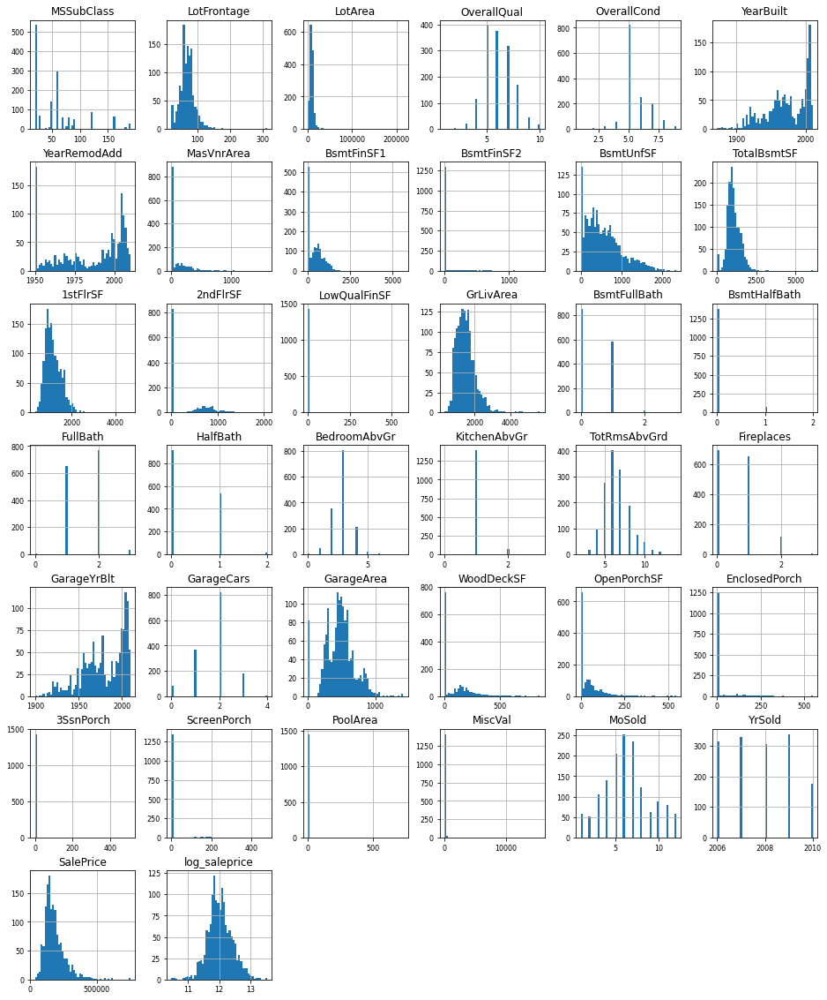

In [0]:
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8); 

From the plots above, we can see that features such as `lotFrontage`, `1stFlrSF`, `TotalBsmtSF`, `GrLiveArea`seems to share a highly similar distribution to `SalePrice`.

We also discover that quite a few variables, such as `BsmtFinSF2`, `LowQualFinSF`, `BsmtHalfBath`, `EnclosedPorch`, `3SsnPorch`, `ScreenPorch`, `PoolArea`, `MiscVal`, `KitchenAbvGr`, are mainly located on single values. A majority of them are located on 0. We think that they may not display useful information for our analysis. We are going to remove these features with near zero variance later.

We further discover the correlation between these numerical attributes.

#### 2.3.1.2 Correlation Matrix and Feature Filtering (Part 2)

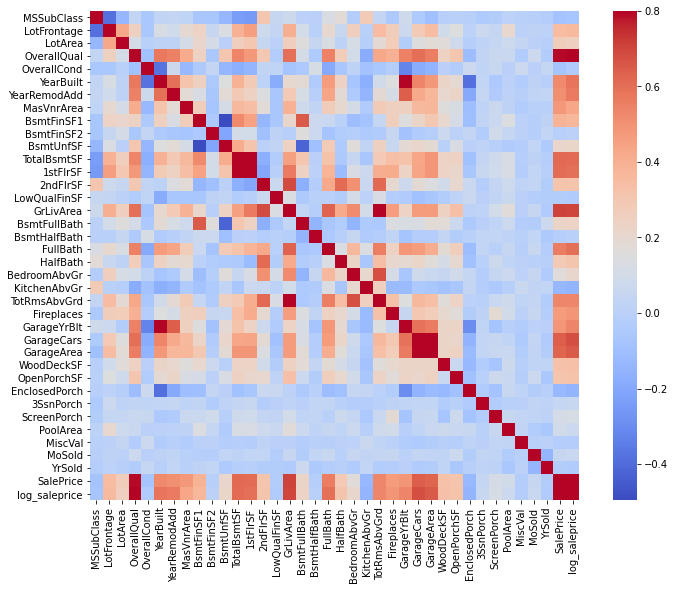

In [0]:
#Overview of correlation matrix
corr_matrix = df_train.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corr_matrix, vmax=.8, square=True, ax=ax, cmap = "coolwarm") 
plt.show()

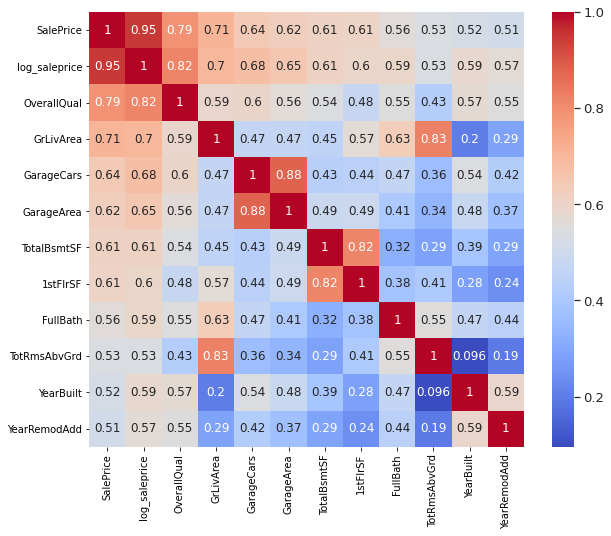

--------------------selected_attributes--------------------
Index(['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF',
 '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd'],
 dtype='object')

In [0]:
# We get a detail look into the top 10 high-correlation features with `SalePrice`
k = 12
sel_attr = corr_matrix.nlargest(k, 'SalePrice').index
sel_mat = corr_matrix.loc[sel_attr, sel_attr]
fig,ax = plt.subplots(figsize=(10,8))
sns.set(font_scale=1.2)
sns.heatmap(sel_mat, annot=True, annot_kws={'size':12}, square=True, cmap = "coolwarm")

plt.show()

print("--------------------selected_attributes--------------------")
print(sel_attr[2:])

The correlation matix displays the top 15 features highly related with `SalePrice`, which are **OverallQual**, **GrLivArea**, **GarageCars**, **GarageArea**, **TotalBsmtSF**, **1stFlrSF**, **FullBath**, **TotRmsAbvGrd**, **YearBuilt**, **YearRemodAdd**.

As `log_saleprice` is proportional to actual `SalePrice`, the top 10 features are almost the same.

We also discover in the correlation matrix that, a few variables have high correlation between each other. We get a detailed look into these features by plotting a correlation matrix.

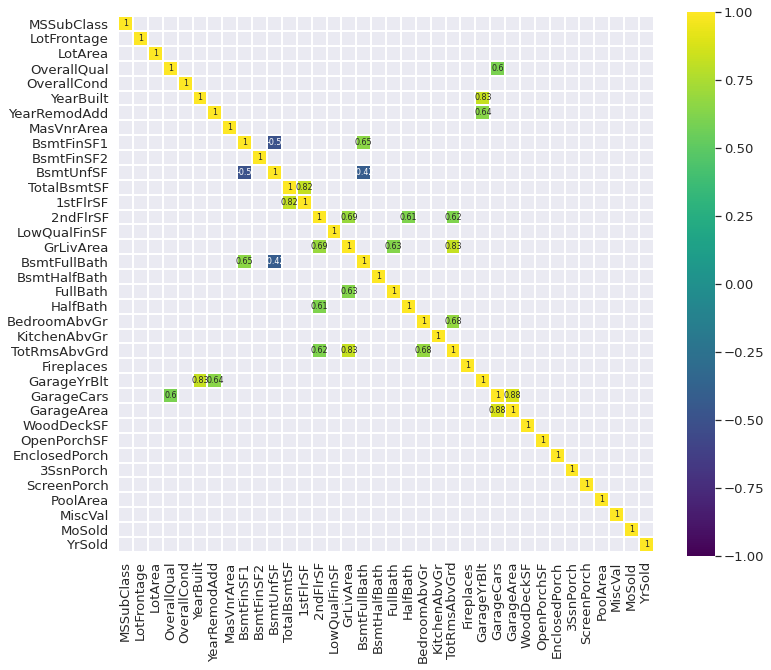

In [0]:
corr = df_train.drop(['SalePrice', 'log_saleprice'], axis=1).corr()
plt.figure(figsize=(12, 10))

sns.heatmap(corr[(corr >= 0.6) | (corr <= -0.4)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

From the plot above, we find that there are a few pairs of extremely high-correlated variables, which are:  
<br>

* **GarageYrBlt** and **YearBuilt**
  * `GarageYrBlt` may be just a inflation over `YearBuilt` and can be safely removed from our analysis.
* **1stFlrSF** and **TotalBsmtSF**
  * It is normal that the more the 1st floor is large (considering many houses have only 1 floor), the more the total basement will be large. Therefore, we would like to delete `TotalBsmtSF` for generality.
* **TotRmsAbvGrd** and **GrLivArea**
  * `TotRmsAbvGrd` is just an aggregation object indicating the total number of rooms above ground. It is evident that the larger the area above ground, the more rooms it should possess. Therefore, we would like to delete `TotRmsAbvGrd` for the sake of analysis simplicity.
* **GarageCars** and **GarageArea**
  * `GarageCars` is a different measurement over garage size by calculating the number of park the garage can hold. It is obvious that the larger the `GarageArea`, the bigger `GarageCars`.

### 2.3.2 Analysis of Categorical Attributes

A tricky thing we discover when we explore the data set is that, a lot of categorical features regard **NA** as a specific class indicating that there's no such corresponding object. This **NA** is not randomly missed value and we should not consider it as the `NA` data type . Rather, we should keep it as a feature of the categorical attributes. And luckily, through spark operation above, `NA` in categorical attributes is by default regarded as strings.

#### 2.3.2.1 Distribution Plots

In [0]:
df_cat = df_train.drop(labels=['SalePrice', 'log_saleprice'], axis=1).select_dtypes(include = ('object'))

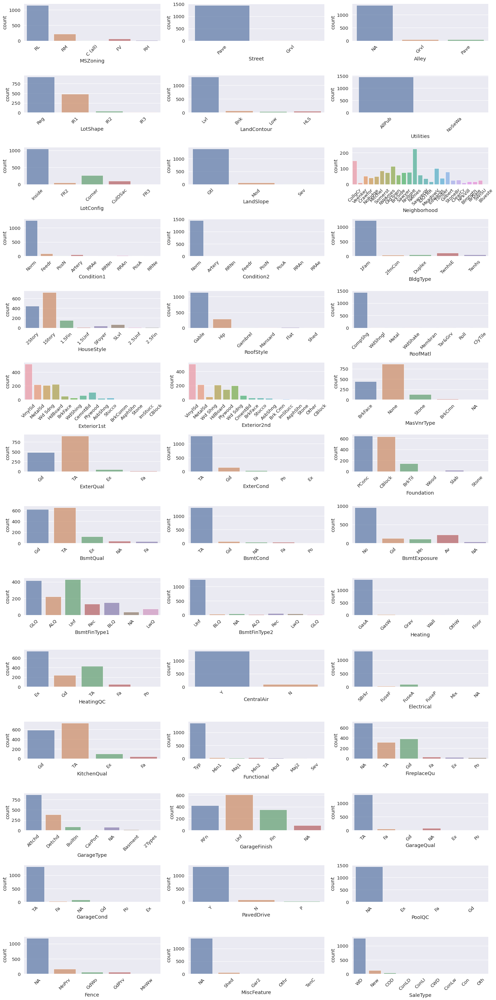

In [0]:
#visualization
fig, axes = plt.subplots(int(np.round(len(df_cat.columns) / 3)), 3, figsize=(20, 40))

for i, ax in enumerate(fig.axes):
    if i < len(df_cat.columns):
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
        sns.countplot(x=df_cat.columns[i], alpha=0.7, data=df_cat, ax=ax)

fig.tight_layout()

Based on the distribution plots, we find that several variables tend to have single value. In order to specify whether these variables have strong prediction power, we plan to conduct near-zero variance test later.

## 2.4 Data Pre-processing

### 2.5.1 Deal With Outliers

In [0]:
df_num = df_train.select_dtypes(exclude = 'object')
df_num.shape

Out[29]: (1460, 38)

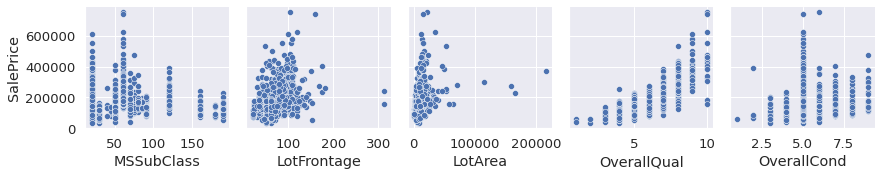

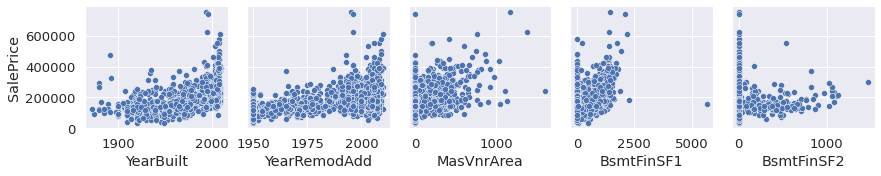

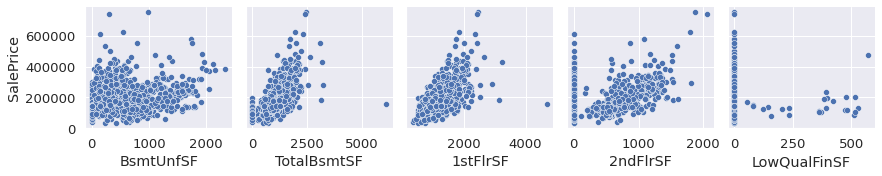

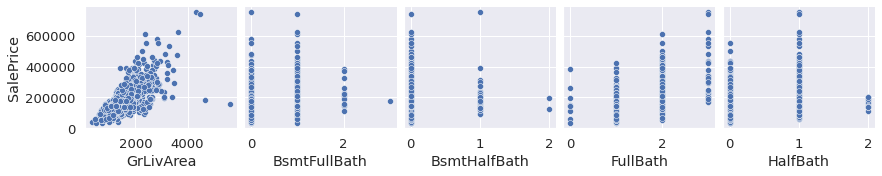

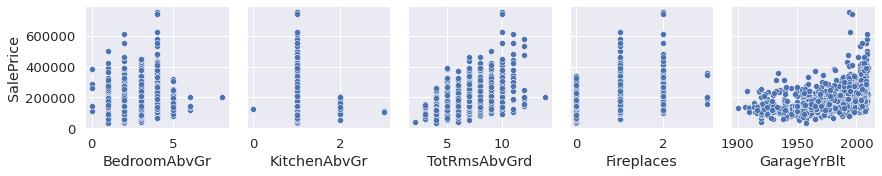

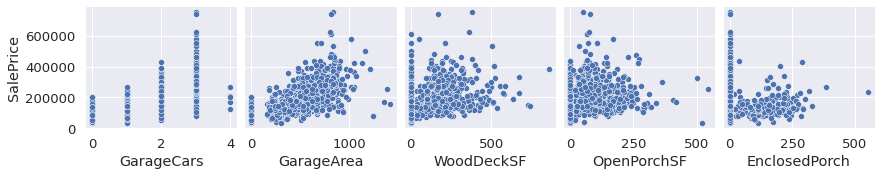

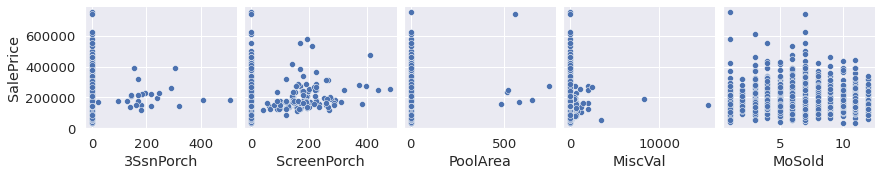

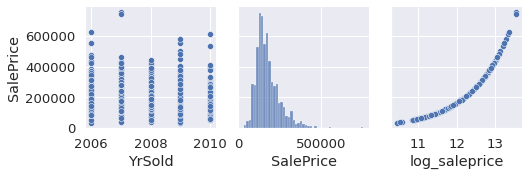

In [0]:
for i in range(0, len(df_num.columns), 5):
    sns.pairplot(data=df_num,
                x_vars=df_num.columns[i:i+5],
                y_vars=['SalePrice'])

By plotting scatterplots we can intuitively find several outliers. We are now going to remove these outliers.

Another thing we discovered is that, many features seem to have a linear relationship with the `log_saleprice`.

In [0]:
df_train = df_train.drop(df_train[(df_train['GrLivArea'] > 4000) & (df_train['SalePrice'] < 300000) | (df_train['TotalBsmtSF'] > 5000)].index, axis = 0)

In [0]:
df_train.shape

Out[32]: (1458, 81)

After removing the outliers, we re-check the scatter plots.

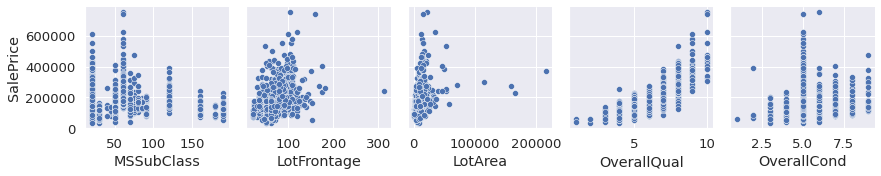

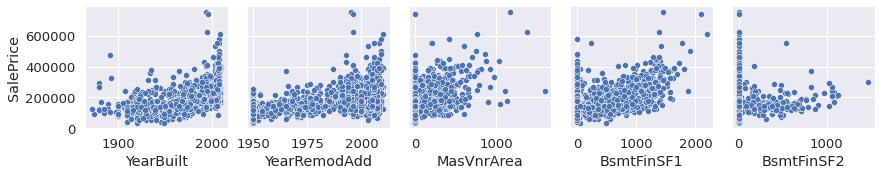

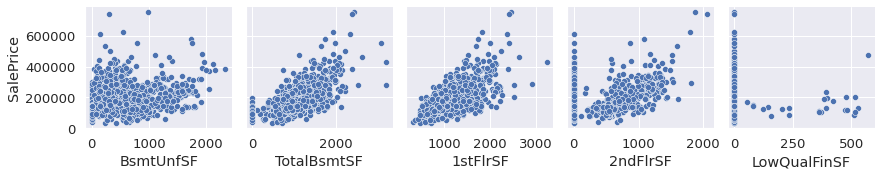

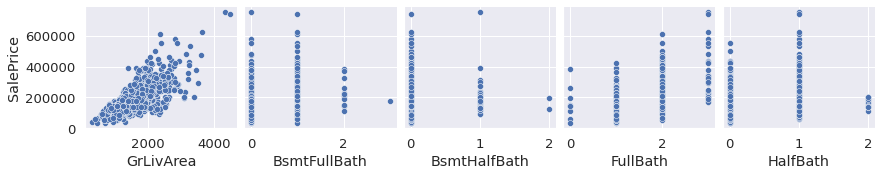

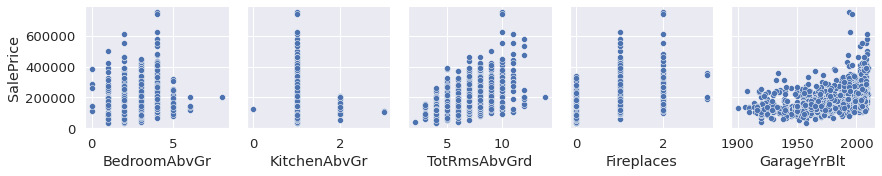

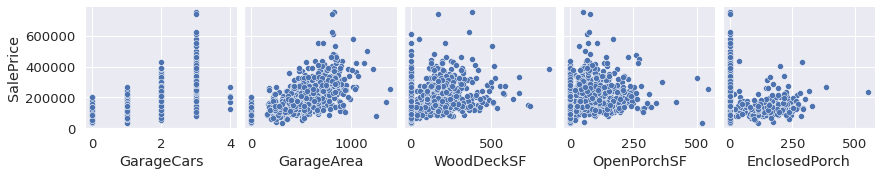

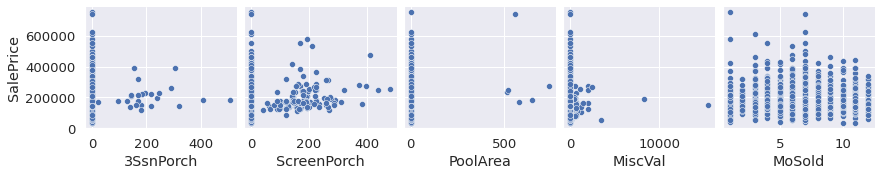

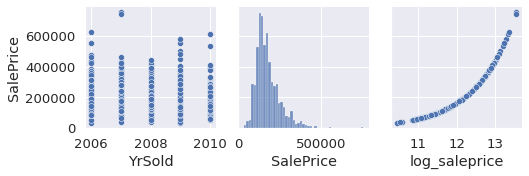

In [0]:
df_num = df_train.select_dtypes(exclude = 'object')

for i in range(0, len(df_num.columns), 5):
    sns.pairplot(data=df_num,
                x_vars=df_num.columns[i:i+5],
                y_vars=['SalePrice'])

After dealing with outliers, we update the categorical features, numerical features and the response variables.

In [0]:
df_num = df_train.select_dtypes(exclude = ('object'))
df_cat = df_train.select_dtypes(include = ('object'))
df_res = df_num[['SalePrice', 'log_saleprice']]
df_num_att = df_num.drop(['SalePrice', 'log_saleprice'], axis = 1)

print(f'the shape of df_train is: {df_train.shape}')
print(f'the shape of df_num_att is: {df_num_att.shape}')
print(f'the shape of df_cat is: {df_cat.shape}')
print(f'the shape of df_res is: {df_res.shape}')

the shape of df_train is: (1458, 81)
the shape of df_num_att is: (1458, 36)
the shape of df_cat is: (1458, 43)
the shape of df_res is: (1458, 2)

### 2.5.2 Deal With Missing Values

In [0]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1458 entries, 0 to 1459
Data columns (total 81 columns):
 # Column Non-Null Count Dtype 
--- ------ -------------- ----- 
 0 MSSubClass 1458 non-null int32 
 1 MSZoning 1458 non-null object 
 2 LotFrontage 1199 non-null float64
 3 LotArea 1458 non-null int32 
 4 Street 1458 non-null object 
 5 Alley 1458 non-null object 
 6 LotShape 1458 non-null object 
 7 LandContour 1458 non-null object 
 8 Utilities 1458 non-null object 
 9 LotConfig 1458 non-null object 
 10 LandSlope 1458 non-null object 
 11 Neighborhood 1458 non-null object 
 12 Condition1 1458 non-null object 
 13 Condition2 1458 non-null object 
 14 BldgType 1458 non-null object 
 15 HouseStyle 1458 non-null object 
 16 OverallQual 1458 non-null int32 
 17 OverallCond 1458 non-null int32 
 18 YearBuilt 1458 non-null int32 
 19 YearRemodAdd 1458 non-null int32 
 20 RoofStyle 1458 non-null object 
 21 RoofMatl 1458 non-null object 
 22 Exterior1st 1458 non-null object 
 23 Exterior2nd 1458 non-null object 
 24 MasVnrType 1458 non-null object 
 25 MasVnrArea 1450 non-null float64
 26 ExterQual 1458 non-null object 
 27 ExterCond 1458 non-null object 
 28 Foundation 1458 non-null object 
 29 BsmtQual 1458 non-null object 
 30 BsmtCond 1458 non-null object 
 31 BsmtExposure 1458 non-null object 
 32 BsmtFinType1 1458 non-null object 
 33 BsmtFinSF1 1458 non-null int32 
 34 BsmtFinType2 1458 non-null object 
 35 BsmtFinSF2 1458 non-null int32 
 36 BsmtUnfSF 1458 non-null int32 
 37 TotalBsmtSF 1458 non-null int32 
 38 Heating 1458 non-null object 
 39 HeatingQC 1458 non-null object 
 40 CentralAir 1458 non-null object 
 41 Electrical 1458 non-null object 
 42 1stFlrSF 1458 non-null int32 
 43 2ndFlrSF 1458 non-null int32 
 44 LowQualFinSF 1458 non-null int32 
 45 GrLivArea 1458 non-null int32 
 46 BsmtFullBath 1458 non-null int32 
 47 BsmtHalfBath 1458 non-null int32 
 48 FullBath 1458 non-null int32 
 49 HalfBath 1458 non-null int32 
 50 BedroomAbvGr 1458 non-null int32 
 51 KitchenAbvGr 1458 non-null int32 
 52 KitchenQual 1458 non-null object 
 53 TotRmsAbvGrd 1458 non-null int32 
 54 Functional 1458 non-null object 
 55 Fireplaces 1458 non-null int32 
 56 FireplaceQu 1458 non-null object 
 57 GarageType 1458 non-null object 
 58 GarageYrBlt 1377 non-null float64
 59 GarageFinish 1458 non-null object 
 60 GarageCars 1458 non-null int32 
 61 GarageArea 1458 non-null int32 
 62 GarageQual 1458 non-null object 
 63 GarageCond 1458 non-null object 
 64 PavedDrive 1458 non-null object 
 65 WoodDeckSF 1458 non-null int32 
 66 OpenPorchSF 1458 non-null int32 
 67 EnclosedPorch 1458 non-null int32 
 68 3SsnPorch 1458 non-null int32 
 69 ScreenPorch 1458 non-null int32 
 70 PoolArea 1458 non-null int32 
 71 PoolQC 1458 non-null object 
 72 Fence 1458 non-null object 
 73 MiscFeature 1458 non-null object 
 74 MiscVal 1458 non-null int32 
 75 MoSold 1458 non-null int32 
 76 YrSold 1458 non-null int32 
 77 SaleType 1458 non-null object 
 78 SaleCondition 1458 non-null object 
 79 SalePrice 1458 non-null int32 
 80 log_saleprice 1458 non-null float64
dtypes: float64(4), int32(34), object(43)
memory usage: 740.4+ KB

In [0]:
missing_train = (df_train.isnull().sum()/len(df_train)).sort_values(ascending=False)
print('Training data missing value proportion')
print(missing_train[missing_train>0])

Training data missing value proportion
LotFrontage 0.177641
GarageYrBlt 0.055556
MasVnrArea 0.005487
dtype: float64

We learn from above that `LotFrontage`, `GarageYrBlt` and `MasVnrArea` has missing values. We are now going to impute the missing values for the variable by its column mean value.

In [0]:
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.impute import SimpleImputer

my_imputer = SimpleImputer()
df = my_imputer.fit_transform(df_num_att)


In [0]:
df_num_att = pd.DataFrame(df, columns = ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'])

In [0]:
df_res.index=range(0,df_train.shape[0])
df_cat.index=range(0,df_train.shape[0]) 
df_num_att.index=range(0,df_train.shape[0]) 

df_train = pd.concat([df_num_att, df_cat, df_res], axis = 1)
df_train.shape

Out[39]: (1458, 81)

In [0]:
missing_train = (df_train.isnull().sum()/len(df_train)).sort_values(ascending=False)
print('Training data missing value proportion')
print(missing_train[missing_train>0])

Training data missing value proportion
Series([], dtype: float64)

Now we use information in train data to fill in the missing value in test data.

In [0]:
missing_test = (df_test.isnull().sum()/len(df_test)).sort_values(ascending=False)
print('Training data missing value proportion')
print(missing_test[missing_test>0])

Training data missing value proportion
LotFrontage 0.155586
GarageYrBlt 0.053461
MasVnrArea 0.010281
BsmtFullBath 0.001371
BsmtHalfBath 0.001371
TotalBsmtSF 0.000685
BsmtUnfSF 0.000685
BsmtFinSF2 0.000685
GarageCars 0.000685
BsmtFinSF1 0.000685
GarageArea 0.000685
dtype: float64

In [0]:
df_num_test = df_test.select_dtypes(exclude = ['object'])
df_cat_test = df_test.select_dtypes(include = ['object'])

print(f'the shape of df_test is: {df_test.shape}')
print(f'the shape of df_num_test is: {df_num_test.shape}')
print(f'the shape of df_cat_test is: {df_cat_test.shape}')

the shape of df_test is: (1459, 79)
the shape of df_num_test is: (1459, 36)
the shape of df_cat_test is: (1459, 43)

In [0]:
df_fill_test = my_imputer.transform(df_num_test)

In [0]:
df_num_test = pd.DataFrame(df_fill_test, columns = ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'])

In [0]:
df_num_test.index=range(0,df_test.shape[0])
df_cat_test.index=range(0,df_test.shape[0]) 

df_test = pd.concat([df_num_test, df_cat_test], axis = 1)
df_test.shape

Out[45]: (1459, 79)

### 2.5.3 Further transformation on variables

As we are interested in the specific date when the house was sold, we are now adding a new column to the orginal train data as well as test data.

In [0]:
ls_YrSold = list(df_train['YrSold'].astype(int))
ls_MoSold = list(df_train['MoSold'].astype(int))
YrMoSold = []

for i, j in list(zip(ls_YrSold, list(map(str, ls_MoSold)))):
    YrMoSold.append(f"{i}{j.zfill(2)}")

YrMoSold = list(map(int, YrMoSold))

In [0]:
df_train['YrMoSold'] = YrMoSold

In [0]:
df_num = df_train.select_dtypes(exclude = ('object'))
df_res = df_num[['SalePrice', 'log_saleprice']]
df_num_att = df_num.drop(['SalePrice', 'log_saleprice'], axis = 1)
df_cat = df_train.select_dtypes(include = ('object'))

print(f'the shape of df_train is: {df_train.shape}')
print(f'the shape of df_num_att is: {df_num_att.shape}')
print(f'the shape of df_cat is: {df_cat.shape}')
print(f'the shape of df_res is: {df_res.shape}')

the shape of df_train is: (1458, 82)
the shape of df_num_att is: (1458, 37)
the shape of df_cat is: (1458, 43)
the shape of df_res is: (1458, 2)

In [0]:
df_train = pd.concat([df_num_att, df_cat, df_res],axis=1) 
df_train.shape

Out[49]: (1458, 82)

We do the same thing on test data

In [0]:
ls_YrSold_test = list(df_test['YrSold'].astype(int))
ls_MoSold_test = list(df_test['MoSold'].astype(int))
YrMoSold_test = []

for i, j in list(zip(ls_YrSold_test, list(map(str, ls_MoSold_test)))):
    YrMoSold_test.append(f"{i}{j.zfill(2)}")

YrMoSold_test = list(map(int, YrMoSold_test))

In [0]:
df_test['YrMoSold'] = YrMoSold_test
df_test.shape

Out[51]: (1459, 80)

In [0]:
df_num_test = df_test.select_dtypes(exclude = ['object'])
df_cat_test = df_test.select_dtypes(include = ['object'])

print(f'the shape of df_test is: {df_test.shape}')
print(f'the shape of df_num_test is: {df_num_test.shape}')
print(f'the shape of df_cat_test is: {df_cat_test.shape}')

the shape of df_test is: (1459, 80)
the shape of df_num_test is: (1459, 37)
the shape of df_cat_test is: (1459, 43)

In [0]:
df_test = pd.concat([df_num_test, df_cat_test],axis=1) 
df_test.shape

Out[53]: (1459, 80)

### 2.5.4 Feature Filtering For Near-Zero-Variance Attributes

In [0]:
def nzv_trans(df):

    zv_sel = []
    
    for i in df.columns:
        uni_col = list(df[i].unique())
        if df.value_counts(i).iloc[0]/df.value_counts(i).iloc[1] >=30:
            if len(uni_col)/df.shape[0]<=0.1:
                zv_sel.append(i)
    
    print(f'the orginal columns in dataframe are: {df.columns}')
    print(f'the shape of the original dataframe is: {df.shape}')
    
    #delete corresponding columns and return the filtered dataframe
    for j in zv_sel:
        df = df.drop([j],axis=1) 
    
    print(f'the filtered columns in dataframe are: {df.columns}')
    print(f'the shape of the filtered dataframe is: {df.shape}')
    
    return df

In [0]:
nzv_train = df_train.copy()

In [0]:
df_train_nzv = nzv_trans(nzv_train)

the orginal columns in dataframe are: Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
 'MoSold', 'YrSold', 'YrMoSold', 'MSZoning', 'Street', 'Alley',
 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition',
 'SalePrice', 'log_saleprice'],
 dtype='object')
the shape of the original dataframe is: (1458, 82)
the filtered columns in dataframe are: Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF',
 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath',
 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'YrMoSold', 'MSZoning',
 'Alley', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope',
 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle',
 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond',
 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
 'BsmtFinType2', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
 'PavedDrive', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition',
 'SalePrice', 'log_saleprice'],
 dtype='object')
the shape of the filtered dataframe is: (1458, 68)

In [0]:
copy_test = df_test.copy()
nzv_test = copy_test[df_train_nzv.drop(['SalePrice', 'log_saleprice'], axis = 1, inplace = False).columns]
nzv_test.shape

Out[57]: (1459, 66)

### 2.5.5 Categorical Feature Engineering

#### 2.5.5.1 Lumping

In [0]:
copy_cat = df_cat.copy()

order_cat = df_cat[['FireplaceQu', 'BsmtQual', 'BsmtCond', 'GarageQual', 'GarageCond','ExterQual', 'ExterCond','HeatingQC', 'PoolQC', 'KitchenQual', 'BsmtFinType1', 'BsmtFinType2', 'BsmtExposure', 'GarageFinish']]

for i in order_cat:
    copy_cat.drop([i],axis=1,inplace=True)

#store nomial categorical variables in nor_cat
nor_cat = copy_cat.copy()

In [0]:
z=0
for i in nor_cat.columns:
    a = list(nor_cat[i].unique())
    other_lst=[]
    for j in range(len(a)):
        if nor_cat.value_counts(i)[j]/nor_cat.shape[0] <= 0.05: # integrate classes with a proportion of less than 10% to "other"
            other_lst.append(a[j])
    for k in range(nor_cat.shape[0]):
        if nor_cat.iloc[k,z] in other_lst:
            nor_cat.iloc[k,z] = "Other"
    z+=1

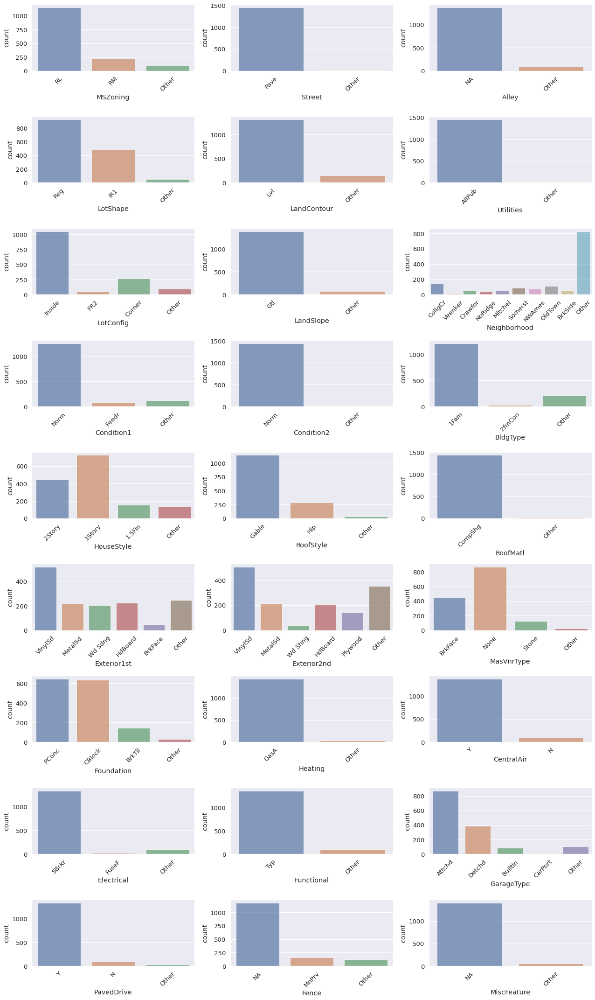

In [0]:
#visualization of norminal categorical variables
fig, axes = plt.subplots(int(np.round(len(nor_cat.columns)) / 3), 3, figsize=(18, 30))

for i, ax in enumerate(fig.axes):
    if i < len(nor_cat.columns):
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
        sns.countplot(x=nor_cat.columns[i], alpha=0.7, data=nor_cat, ax=ax)

fig.tight_layout()

#### 2.5.5.2 Categorical variable encoding

In ordinal categorical features, we follow the description of the data and manually assign them with discrete numbers represented as priority. We do not use `StringIndexer` in pyspark because this method in pyspark assign values with priority according to their frequency, which may lead to worse interpretability in our model.

In [0]:
#Ordinal categorical variables - subset 1
order_1 = ['ExterQual', 'ExterCond','HeatingQC', 'KitchenQual']

for i in order_1:    
    mapping = [
        {
            'col': i,
            'mapping':{
                'Ex': 5,
                'Gd': 4,
                'TA': 3,
                'Fa': 2,
                'Po': 1
            }
        }
    ]
    encoder = category_encoders.OrdinalEncoder(
        cols = [i],
        return_df = True,
        mapping = mapping
    )
    order_cat[i] = encoder.fit_transform(order_cat[i])

In [0]:
#Ordinal categorical variables - subset 2
order_2 = ['FireplaceQu', 'BsmtQual', 'BsmtCond', 'GarageQual', 'GarageCond']

for i in order_2:    
    mapping = [
        {
            'col': i,
            'mapping':{
                'Ex': 5,
                'Gd': 4,
                'TA': 3,
                'Fa': 2,
                'Po': 1,
                'NA': 0
            }
        }
    ]
    encoder = category_encoders.OrdinalEncoder(
        cols = [i],
        return_df = True,
        mapping = mapping
    )
    order_cat[i] = encoder.fit_transform(order_cat[i])

In [0]:
#Ordinal categorical variables - subset 3
order_3 = ['PoolQC']

for i in order_3:    
    mapping = [
        {
            'col': i,
            'mapping':{
                'Ex': 5,
                'Gd': 4,
                'TA': 3,
                'Fa': 2,
                'NA': 1
            }
        }
    ]
    encoder = category_encoders.OrdinalEncoder(
        cols = [i],
        return_df = True,
        mapping = mapping
    )
    order_cat[i] = encoder.fit_transform(order_cat[i])

In [0]:
#Ordinal categorical variables - subset 4
order_4 = ['BsmtFinType1', 'BsmtFinType2']

for i in order_4:    
    mapping = [
        {
            'col': i,
            'mapping':{
                'GLQ': 6,
                'ALQ': 5,
                'BLQ': 4,
                'Rec': 3,
                'LwQ': 2,
                'Unf': 1,
                'NA': 0
            }
        }
    ]
    encoder = category_encoders.OrdinalEncoder(
        cols = [i],
        return_df = True,
        mapping = mapping
    )
    order_cat[i] = encoder.fit_transform(order_cat[i])

In [0]:
#Ordinal categorical variables - subset 5
order_5 = ['GarageFinish']

for i in order_5:    
    mapping = [
        {
            'col': i,
            'mapping':{
                'Fin': 3,
                'RFn': 2,
                'Unf': 1,
                'NA': 0
            }
        }
    ]
    encoder = category_encoders.OrdinalEncoder(
        cols = [i],
        return_df = True,
        mapping = mapping
    )
    order_cat[i] = encoder.fit_transform(order_cat[i])

In [0]:
#Ordinal categorical variables - subset 6
order_6 = ['BsmtExposure']

for i in order_6:    
    mapping = [
        {
            'col': i,
            'mapping':{
                'Gd': 4,
                'AV': 3,
                'Mn': 2,
                'No': 1,
                'NA': 0
            }
        }
    ]
    encoder = category_encoders.OrdinalEncoder(
        cols = [i],
        return_df = True,
        mapping = mapping
    )
    order_cat[i] = encoder.fit_transform(order_cat[i])

In [0]:
order_cat

Out[67]:

,FireplaceQu,BsmtQual,BsmtCond,GarageQual,GarageCond,ExterQual,ExterCond,HeatingQC,PoolQC,KitchenQual,BsmtFinType1,BsmtFinType2,BsmtExposure,GarageFinish
0,0,4,3,3,3,4,3,5,1,4,6,1,1.0,2
1,3,4,3,3,3,3,3,5,1,3,5,1,4.0,2
2,3,4,3,3,3,4,3,5,1,4,6,1,2.0,2
3,4,3,4,3,3,3,3,4,1,4,5,1,1.0,1
4,3,4,3,3,3,4,3,5,1,4,6,1,-1.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,3,4,3,3,3,3,3,5,1,3,1,1,1.0,2
1454,3,4,3,3,3,3,3,3,1,3,5,3,1.0,1
1455,4,3,4,3,3,5,4,5,1,4,6,1,1.0,2
1456,0,3,3,3,3,3,3,4,1,4,6,3,2.0,1


In [0]:
nor_cat = pd.get_dummies(nor_cat)
nor_cat

Out[68]:

,MSZoning_Other,MSZoning_RL,MSZoning_RM,Street_Other,Street_Pave,Alley_NA,Alley_Other,LotShape_IR1,LotShape_Other,LotShape_Reg,LandContour_Lvl,LandContour_Other,Utilities_AllPub,Utilities_Other,LotConfig_Corner,LotConfig_FR2,LotConfig_Inside,LotConfig_Other,LandSlope_Gtl,LandSlope_Other,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Mitchel,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_OldTown,Neighborhood_Other,Neighborhood_Somerst,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Other,Condition2_Norm,Condition2_Other,BldgType_1Fam,BldgType_2fmCon,BldgType_Other,HouseStyle_1.5Fin,HouseStyle_1Story,...,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Other,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_Other,Foundation_PConc,Heating_GasA,Heating_Other,CentralAir_N,CentralAir_Y,Electrical_FuseF,Electrical_Other,Electrical_SBrkr,Functional_Other,Functional_Typ,GarageType_Attchd,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_Other,PavedDrive_N,PavedDrive_Other,PavedDrive_Y,Fence_MnPrv,Fence_NA,Fence_Other,MiscFeature_NA,MiscFeature_Other,SaleType_New,SaleType_Other,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Normal,SaleCondition_Other,SaleCondition_Partial
0,0,1,0,0,1,1,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0
1,0,1,0,0,1,1,0,0,0,1,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,0,1,...,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0
2,0,1,0,0,1,1,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0
3,0,1,0,0,1,1,0,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,1,0,0,0,1,1,0,0,0
4,0,1,0,0,1,1,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,0,1,0,0,1,1,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0
1454,0,1,0,0,1,1,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,...,1,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,1,0,0
1455,0,1,0,0,1,1,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,0,1,0,0
1456,0,1,0,0,1,1,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,0,0,1,...,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0


In [0]:
trans_cat = pd.concat([nor_cat,order_cat],axis=1) 
trans_cat.shape

Out[69]: (1458, 110)

### 2.5.6 Numerical Feature Engineering

In [0]:
df_num_att.shape

Out[70]: (1458, 37)

In [0]:
# normalize and standardize data
std_scale = preprocessing.StandardScaler().fit(df_num_att)
stand_num = std_scale.transform(df_num_att)

stand_num = pd.DataFrame(stand_num, columns = df_num_att.columns)

In [0]:
stand_num.shape

Out[72]: (1458, 37)

### 2.5.7 Train data set prepared

In [0]:
#unify the index of stand_num, salesprice and df_cat

stand_train = pd.concat([stand_num, trans_cat, df_res],axis=1) 
no_stand_train = pd.concat([df_num_att, trans_cat, df_res],axis=1) 
df_train_new = pd.concat([df_num_att, df_cat, df_res],axis=1)

Now we have three train data set ready for analysis, which are `stand_train` where numerical attributes have been normalized and standardized, and `no_stand_train` where numerical attributes have not been normalized and standardized. We also have `df_train`, where all selected attributes have not been transformed yet.

In [0]:
display(df_train_new.head())
print(df_train_new.shape)

MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,YrMoSold,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice,log_saleprice
60.0,65.0,8450.0,7.0,5.0,2003.0,2003.0,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,8.0,0.0,2003.0,2.0,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,200802,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal,208500,12.247694320220994
20.0,80.0,9600.0,6.0,8.0,1976.0,1976.0,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,6.0,1.0,1976.0,2.0,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,200705,RL,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal,181500,12.109010932687042
60.0,68.0,11250.0,7.0,5.0,2001.0,2002.0,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,6.0,1.0,2001.0,2.0,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,200809,RL,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal,223500,12.31716669303576
70.0,60.0,9550.0,7.0,5.0,1915.0,1970.0,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,7.0,1.0,1998.0,3.0,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0,200602,RL,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NA,NA,NA,WD,Abnorml,140000,11.84939770159144
60.0,84.0,14260.0,8.0,5.0,2000.0,2000.0,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,9.0,1.0,2000.0,3.0,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,200812,RL,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal,250000,12.429216196844383


(1458, 82)

In [0]:
display(no_stand_train.head())
print(no_stand_train.shape)

MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,YrMoSold,MSZoning_Other,MSZoning_RL,MSZoning_RM,Street_Other,Street_Pave,Alley_NA,Alley_Other,LotShape_IR1,LotShape_Other,LotShape_Reg,LandContour_Lvl,LandContour_Other,Utilities_AllPub,Utilities_Other,LotConfig_Corner,LotConfig_FR2,LotConfig_Inside,LotConfig_Other,LandSlope_Gtl,LandSlope_Other,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Mitchel,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_OldTown,Neighborhood_Other,Neighborhood_Somerst,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Other,Condition2_Norm,Condition2_Other,BldgType_1Fam,BldgType_2fmCon,BldgType_Other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Other,RoofStyle_Gable,RoofStyle_Hip,RoofStyle_Other,RoofMatl_CompShg,RoofMatl_Other,Exterior1st_BrkFace,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Other,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Other,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_Other,Foundation_PConc,Heating_GasA,Heating_Other,CentralAir_N,CentralAir_Y,Electrical_FuseF,Electrical_Other,Electrical_SBrkr,Functional_Other,Functional_Typ,GarageType_Attchd,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_Other,PavedDrive_N,PavedDrive_Other,PavedDrive_Y,Fence_MnPrv,Fence_NA,Fence_Other,MiscFeature_NA,MiscFeature_Other,SaleType_New,SaleType_Other,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Normal,SaleCondition_Other,SaleCondition_Partial,FireplaceQu,BsmtQual,BsmtCond,GarageQual,GarageCond,ExterQual,ExterCond,HeatingQC,PoolQC,KitchenQual,BsmtFinType1,BsmtFinType2,BsmtExposure,GarageFinish,SalePrice,log_saleprice
60.0,65.0,8450.0,7.0,5.0,2003.0,2003.0,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,8.0,0.0,2003.0,2.0,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,200802,0,1,0,0,1,1,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,4,3,3,3,4,3,5,1,4,6,1,1.0,2,208500,12.247694320220994
20.0,80.0,9600.0,6.0,8.0,1976.0,1976.0,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,6.0,1.0,1976.0,2.0,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,200705,0,1,0,0,1,1,0,0,0,1,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,3,4,3,3,3,3,3,5,1,3,5,1,4.0,2,181500,12.109010932687042
60.0,68.0,11250.0,7.0,5.0,2001.0,2002.0,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,6.0,1.0,2001.0,2.0,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,200809,0,1,0,0,1,1,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,3,4,3,3,3,4,3,5,1,4,6,1,2.0,2,223500,12.31716669303576
70.0,60.0,9550.0,7.0,5.0,1915.0,1970.0,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,7.0,1.0,1998.0,3.0,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0,200602,0,1,0,0,1,1,0,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,1,0,0,0,1,1,0,0,0,4,3,4,3,3,3,3,4,1,4,5,1,1.0,1,140000,11.84939770159144
60.0,84.0,14260.0,8.0,5.0,2000.0,2000.0,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.

(1458, 149)

In [0]:
display(stand_train.head())
print(stand_train.shape)

MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,YrMoSold,MSZoning_Other,MSZoning_RL,MSZoning_RM,Street_Other,Street_Pave,Alley_NA,Alley_Other,LotShape_IR1,LotShape_Other,LotShape_Reg,LandContour_Lvl,LandContour_Other,Utilities_AllPub,Utilities_Other,LotConfig_Corner,LotConfig_FR2,LotConfig_Inside,LotConfig_Other,LandSlope_Gtl,LandSlope_Other,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Mitchel,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_OldTown,Neighborhood_Other,Neighborhood_Somerst,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Other,Condition2_Norm,Condition2_Other,BldgType_1Fam,BldgType_2fmCon,BldgType_Other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Other,RoofStyle_Gable,RoofStyle_Hip,RoofStyle_Other,RoofMatl_CompShg,RoofMatl_Other,Exterior1st_BrkFace,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Other,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Other,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_Other,Foundation_PConc,Heating_GasA,Heating_Other,CentralAir_N,CentralAir_Y,Electrical_FuseF,Electrical_Other,Electrical_SBrkr,Functional_Other,Functional_Typ,GarageType_Attchd,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_Other,PavedDrive_N,PavedDrive_Other,PavedDrive_Y,Fence_MnPrv,Fence_NA,Fence_Other,MiscFeature_NA,MiscFeature_Other,SaleType_New,SaleType_Other,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Normal,SaleCondition_Other,SaleCondition_Partial,FireplaceQu,BsmtQual,BsmtCond,GarageQual,GarageCond,ExterQual,ExterCond,HeatingQC,PoolQC,KitchenQual,BsmtFinType1,BsmtFinType2,BsmtExposure,GarageFinish,SalePrice,log_saleprice
0.07342554318993741,-0.22808532095104073,-0.2039340828356234,0.6585056898524718,-0.5176493983218948,1.0529594334546615,0.8803616537560043,0.5212562380369521,0.6172831118734065,-0.2888672502814358,-0.9437953205568508,-0.47376589778315586,-0.8143089088062674,1.1676261960718235,-0.12032535898719515,0.39301280365359115,1.1138859515324988,-0.24123593087845216,0.7935456723272978,1.2296987080048793,0.16389442501376178,-0.21160505080192882,0.9218118550810168,-0.9522312637608562,1.0232377731566868,0.3131587769682692,0.3579733313013207,-0.7508306973323727,0.2259815963113046,-0.3596031128540889,-0.11642013330225756,-0.2704071603508091,-0.06370868494919027,-0.08774839620454343,-1.6015780531759132,0.13837519683794053,0.10612295624071197,0,1,0,0,1,1,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,4,3,3,3,4,3,5,1,4,6,1,1.0,2,208500,12.247694320220994
-0.8718675426460787,0.4850778392201119,-0.08725171570411157,-0.0682931714684247,2.1778249686542592,0.15842792459851568,-0.4281151589661407,-0.5744046585889752,1.245719021526144,-0.2888672502814358,-0.6405836898155203,0.5049247215514256,0.2773475023706638,-0.7943537755713799,-0.12032535898719515,-0.4893905812573208,-0.8195018071989099,3.9459305836546816,0.7935456723272978,-0.7602021979564014,0.16389442501376178,-0.21160505080192882,-0.31632880333273006,0.6059653496659992,-0.1027598935748878,0.3131587769682692,-0.056795353389920956,1.627328039316132,-0.7083039751248615,-0.3596031128540889,-0.11642013330225756,-0.2704071603508091,-0.06370868494919027,-0.08774839620454343,-0.4901545398344179,-0.614427179989281,-0.626108356112209,0,1,0,0,1,1,0,0,0,1,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,

(1458, 149)

### 2.5.8 Test data set prepared

#### 2.5.8.1 Categorical Feature Engineering

In [0]:
copy_cat_test = df_cat_test.copy()

order_cat_test = df_cat_test[['FireplaceQu', 'BsmtQual', 'BsmtCond', 'GarageQual', 'GarageCond','ExterQual', 'ExterCond','HeatingQC', 'PoolQC', 'KitchenQual', 'BsmtFinType1', 'BsmtFinType2', 'BsmtExposure', 'GarageFinish']]

for i in order_cat_test:
    copy_cat_test.drop([i],axis=1,inplace=True)

#store nomial categorical variables in nor_cat
nor_cat_test = copy_cat_test.copy()

In [0]:
z=0
for i in nor_cat_test.columns:
    a = list(nor_cat_test[i].unique())
    other_lst=[]
    for j in range(len(a)):
        if nor_cat_test.value_counts(i)[j]/nor_cat_test.shape[0] <= 0.05: # integrate classes with a proportion of less than 10% to "other"
            other_lst.append(a[j])
    for k in range(nor_cat_test.shape[0]):
        if nor_cat_test.iloc[k,z] in other_lst:
            nor_cat_test.iloc[k,z] = "Other"
    z+=1

In [0]:
#Ordinal categorical variables - subset 1
order_1 = ['ExterQual', 'ExterCond','HeatingQC', 'KitchenQual']

for i in order_1:    
    mapping = [
        {
            'col': i,
            'mapping':{
                'Ex': 5,
                'Gd': 4,
                'TA': 3,
                'Fa': 2,
                'Po': 1
            }
        }
    ]
    encoder = category_encoders.OrdinalEncoder(
        cols = [i],
        return_df = True,
        mapping = mapping
    )
    order_cat_test[i] = encoder.fit_transform(order_cat_test[i])

In [0]:
#Ordinal categorical variables - subset 2
order_2 = ['FireplaceQu', 'BsmtQual', 'BsmtCond', 'GarageQual', 'GarageCond']

for i in order_2:    
    mapping = [
        {
            'col': i,
            'mapping':{
                'Ex': 5,
                'Gd': 4,
                'TA': 3,
                'Fa': 2,
                'Po': 1,
                'NA': 0
            }
        }
    ]
    encoder = category_encoders.OrdinalEncoder(
        cols = [i],
        return_df = True,
        mapping = mapping
    )
    order_cat_test[i] = encoder.fit_transform(order_cat_test[i])

In [0]:
#Ordinal categorical variables - subset 3
order_3 = ['PoolQC']

for i in order_3:    
    mapping = [
        {
            'col': i,
            'mapping':{
                'Ex': 5,
                'Gd': 4,
                'TA': 3,
                'Fa': 2,
                'NA': 1
            }
        }
    ]
    encoder = category_encoders.OrdinalEncoder(
        cols = [i],
        return_df = True,
        mapping = mapping
    )
    order_cat_test[i] = encoder.fit_transform(order_cat_test[i])

In [0]:
#Ordinal categorical variables - subset 4
order_4 = ['BsmtFinType1', 'BsmtFinType2']

for i in order_4:    
    mapping = [
        {
            'col': i,
            'mapping':{
                'GLQ': 6,
                'ALQ': 5,
                'BLQ': 4,
                'Rec': 3,
                'LwQ': 2,
                'Unf': 1,
                'NA': 0
            }
        }
    ]
    encoder = category_encoders.OrdinalEncoder(
        cols = [i],
        return_df = True,
        mapping = mapping
    )
    order_cat_test[i] = encoder.fit_transform(order_cat_test[i])

In [0]:
#Ordinal categorical variables - subset 5
order_5 = ['GarageFinish']

for i in order_5:    
    mapping = [
        {
            'col': i,
            'mapping':{
                'Fin': 3,
                'RFn': 2,
                'Unf': 1,
                'NA': 0
            }
        }
    ]
    encoder = category_encoders.OrdinalEncoder(
        cols = [i],
        return_df = True,
        mapping = mapping
    )
    order_cat_test[i] = encoder.fit_transform(order_cat_test[i])

In [0]:
#Ordinal categorical variables - subset 6
order_6 = ['BsmtExposure']

for i in order_6:    
    mapping = [
        {
            'col': i,
            'mapping':{
                'Gd': 4,
                'AV': 3,
                'Mn': 2,
                'No': 1,
                'NA': 0
            }
        }
    ]
    encoder = category_encoders.OrdinalEncoder(
        cols = [i],
        return_df = True,
        mapping = mapping
    )
    order_cat_test[i] = encoder.fit_transform(order_cat_test[i])

In [0]:
nor_cat_test = pd.get_dummies(nor_cat_test)

In [0]:
trans_cat_test = pd.concat([nor_cat_test,order_cat_test],axis=1) 

#### 2.5.8.2 Numerical Feature Engineering

In [0]:
stand_num_test = std_scale.transform(df_num_test)
stand_num_test = pd.DataFrame(stand_num_test, columns=df_num_test.columns)

#### 2.5.8.3 Test data set prepared

In [0]:
stand_test = pd.concat([stand_num_test, trans_cat_test],axis=1) 
no_stand_test = pd.concat([df_num_test, trans_cat_test],axis=1) 
df_test_new = pd.concat([df_num_test, df_cat_test],axis=1) 

In [0]:
print(f'the shape of stand_test is: {stand_test.shape}')
print(f'the shape of no_stand_test is: {no_stand_test.shape}')
print(f'the shape of df_test_new is: {df_test_new.shape}')

the shape of stand_test is: (1459, 147)
the shape of no_stand_test is: (1459, 147)
the shape of df_test_new is: (1459, 80)

# 3 Overview of all data prepared and save data

## 3.1 Train Data

In [0]:
stand_trainDF = spark.createDataFrame(stand_train)
no_stand_trainDF = spark.createDataFrame(no_stand_train)
train_newDF = spark.createDataFrame(df_train_new)

## 3.2 Test Data

In [0]:
stand_testDF = spark.createDataFrame(stand_test)
no_stand_testDF = spark.createDataFrame(no_stand_test)
test_newDF = spark.createDataFrame(df_test_new)

# 4. Model training

##4.0 Benchmark: KNN

### 4.0.1  Data Preparation

In [0]:
import numpy as np
import pandas as pd

trainDF = stand_trainDF

trainLabel = trainDF.toPandas().log_saleprice
trainDF = trainDF.drop('log_saleprice','SalePrice').toPandas()

x_train, y_train= trainDF, trainLabel
display(trainDF)

MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,YrMoSold,MSZoning_Other,MSZoning_RL,MSZoning_RM,Street_Other,Street_Pave,Alley_NA,Alley_Other,LotShape_IR1,LotShape_Other,LotShape_Reg,LandContour_Lvl,LandContour_Other,Utilities_AllPub,Utilities_Other,LotConfig_Corner,LotConfig_FR2,LotConfig_Inside,LotConfig_Other,LandSlope_Gtl,LandSlope_Other,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Mitchel,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_OldTown,Neighborhood_Other,Neighborhood_Somerst,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Other,Condition2_Norm,Condition2_Other,BldgType_1Fam,BldgType_2fmCon,BldgType_Other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Other,RoofStyle_Gable,RoofStyle_Hip,RoofStyle_Other,RoofMatl_CompShg,RoofMatl_Other,Exterior1st_BrkFace,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Other,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Other,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_Other,Foundation_PConc,Heating_GasA,Heating_Other,CentralAir_N,CentralAir_Y,Electrical_FuseF,Electrical_Other,Electrical_SBrkr,Functional_Other,Functional_Typ,GarageType_Attchd,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_Other,PavedDrive_N,PavedDrive_Other,PavedDrive_Y,Fence_MnPrv,Fence_NA,Fence_Other,MiscFeature_NA,MiscFeature_Other,SaleType_New,SaleType_Other,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Normal,SaleCondition_Other,SaleCondition_Partial,FireplaceQu,BsmtQual,BsmtCond,GarageQual,GarageCond,ExterQual,ExterCond,HeatingQC,PoolQC,KitchenQual,BsmtFinType1,BsmtFinType2,BsmtExposure,GarageFinish
0.07342554318993741,-0.22808532095104073,-0.2039340828356234,0.6585056898524718,-0.5176493983218948,1.0529594334546615,0.8803616537560043,0.5212562380369521,0.6172831118734065,-0.2888672502814358,-0.9437953205568508,-0.47376589778315586,-0.8143089088062674,1.1676261960718235,-0.12032535898719515,0.39301280365359115,1.1138859515324988,-0.24123593087845216,0.7935456723272978,1.2296987080048793,0.16389442501376178,-0.21160505080192882,0.9218118550810168,-0.9522312637608562,1.0232377731566868,0.3131587769682692,0.3579733313013207,-0.7508306973323727,0.2259815963113046,-0.3596031128540889,-0.11642013330225756,-0.2704071603508091,-0.06370868494919027,-0.08774839620454343,-1.6015780531759132,0.13837519683794053,0.10612295624071197,0,1,0,0,1,1,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,4,3,3,3,4,3,5,1,4,6,1,1.0,2
-0.8718675426460787,0.4850778392201119,-0.08725171570411157,-0.0682931714684247,2.1778249686542592,0.15842792459851568,-0.4281151589661407,-0.5744046585889752,1.245719021526144,-0.2888672502814358,-0.6405836898155203,0.5049247215514256,0.2773475023706638,-0.7943537755713799,-0.12032535898719515,-0.4893905812573208,-0.8195018071989099,3.9459305836546816,0.7935456723272978,-0.7602021979564014,0.16389442501376178,-0.21160505080192882,-0.31632880333273006,0.6059653496659992,-0.1027598935748878,0.3131587769682692,-0.056795353389920956,1.627328039316132,-0.7083039751248615,-0.3596031128540889,-0.11642013330225756,-0.2704071603508091,-0.06370868494919027,-0.08774839620454343,-0.4901545398344179,-0.614427179989281,-0.626108356112209,0,1,0,0,1,1,0,0,0,1,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,

### 4.0.2 Model Training & Testing Using Label "log_saleprice"

In [0]:
#Importing the tools
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

#Building Hyperparameter Grid
num_nbr = [1,3,5,10,20]
weights = ["uniform", "distance"]
algos = ["ball_tree", "kd_tree", "brute"]
result = {
    "num_of_neighbors":[],
    "weight":[],
    "algorithm":[],
    "cv_rmse":[]
}

#Finding the best hyperparameters using cross validation
kf = KFold(n_splits = 5)
for nbr in num_nbr:
    for w in weights:
        for algo in algos:
            
            knn = KNeighborsRegressor(n_neighbors = nbr, weights = w, algorithm = algo)
            rmse_lst = []
            
            for train, test in kf.split(x_train, y_train):
                x_cv_train = x_train.iloc[train]
                y_cv_train = y_train.iloc[train]
                x_cv_test = x_train.iloc[test]
                y_cv_test = y_train.iloc[test]
                knn.fit(x_cv_train, y_cv_train)
                y_pred = knn.predict(x_cv_test)
                rmse = np.sqrt(mean_squared_error(y_cv_test,y_pred))
                rmse_lst.append(rmse)

            cv_rmse=np.mean(rmse_lst)
            result["num_of_neighbors"].append(nbr)
            result["weight"].append(w)
            result["algorithm"].append(algo)
            result["cv_rmse"].append(cv_rmse)
            
knn_result = pd.DataFrame(result)
knn_result.sort_values(by='cv_rmse').head()

Out[93]:

,num_of_neighbors,weight,algorithm,cv_rmse
23,10,distance,brute,0.170603
22,10,distance,kd_tree,0.170603
21,10,distance,ball_tree,0.170603
17,5,distance,brute,0.171315
16,5,distance,kd_tree,0.171315


In [0]:
knn_cv_rmse =  float(knn_result.sort_values(by='cv_rmse').head(1)['cv_rmse'])
knn_cv_rmse

Out[94]: 0.1706026378822107

- Based on the training result, when using "log_saleprice" as response label, the best KNN model achieves an CV RMSE = 0.1706, with number of neighbors = 10, weighting method = "distance", and algorithms are indifferent.
- Thus, in the following model building we will use KNN's CV RMSE as our benchmark. Any model with a CV RMSE higher than 0.1706 will not be taken into consideration.

## 4.1 Model: Linear Regression

### 4.1.1 Data Preparation

In [0]:
trainDF = stand_trainDF

In [0]:
from pyspark.ml.linalg import Vector
from pyspark.ml.feature import VectorAssembler
from pyspark.sql import SparkSession
from pyspark.ml.regression import LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml import Pipeline

In [0]:
trainDF=trainDF.withColumnRenamed("HouseStyle_1.5Fin","HouseStyle_15Fin")
assemblerInputs = [field for (field, dataType) in trainDF.dtypes 
               if ((dataType == "double") & (field != "SalePrice")& (field != "log_saleprice"))]
vec = VectorAssembler(inputCols = assemblerInputs, outputCol = "features")

vecTrainDF = vec.transform(trainDF)
vecTrainDF.select("features", "log_saleprice").show(10)

+--------------------+------------------+
 features| log_saleprice|
+--------------------+------------------+
[0.07342554318993...|12.247694320220994|
[-0.8718675426460...|12.109010932687042|
[0.07342554318993...| 12.31716669303576|
[0.30974881464894...| 11.84939770159144|
[0.07342554318993...|12.429216196844383|
[-0.1628977282690...|11.870599909242044|
[-0.8718675426460...|12.634603026569334|
[0.07342554318993...|12.206072645530174|
[-0.1628977282690...| 11.77452020265869|
[3.14562807215698...|11.678439903447801|
+--------------------+------------------+
only showing top 10 rows

### 4.1.2 Fit linear regression model to data

In [0]:
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
import pandas as pd

lr = LinearRegression(featuresCol="features", labelCol="log_saleprice") 

pipeline = Pipeline(stages=[vec, lr]) 

lrparamGrid = (ParamGridBuilder()
            .build())

evaluator_lr = RegressionEvaluator(labelCol="log_saleprice", 
                                predictionCol="prediction", 
                                metricName="rmse")

cv_lr = CrossValidator(estimator=pipeline, 
                    evaluator=evaluator_lr, 
                    estimatorParamMaps = lrparamGrid,
                    numFolds=5, 
                    seed=123)

cvModel_lr = cv_lr.fit(trainDF)
pd.DataFrame(list(zip(cvModel_lr.getEstimatorParamMaps(), cvModel_lr.avgMetrics)))

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.
Out[148]:

,0,1
0,{},0.127476


In [0]:
lr_cv_rmse=float(pd.DataFrame(list(zip(cvModel_lr.getEstimatorParamMaps(), cvModel_lr.avgMetrics)))[1])
lr_cv_rmse

Out[149]: 0.1274759071173827

## 4.2 Model: Lasso Regression Model

### 4.2.1 Lasso regression with different alphas

In [0]:
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.ml.evaluation import RegressionEvaluator
import pandas as pd

result_las = {
    "alpha":[],
    "cv_rmse":[]
}


# Fit Lasso Regression model to data
las = LinearRegression(featuresCol="features", 
                     labelCol="log_saleprice", 
                     elasticNetParam=1, # L1 penalty (Lasso)
                     loss = "squaredError") 

# Auomate the process
pipeline_las = Pipeline(stages=[vec, las]) 
lasparamGrid = (ParamGridBuilder()
              .addGrid(las.regParam, 
                       [0, 0.0001, 0.0005, 0.001, 0.0015, 0.002])
              .build())

evaluator_las = RegressionEvaluator(labelCol="log_saleprice", 
                                  predictionCol="prediction", 
                                  metricName="rmse")
cv_las = CrossValidator(estimator=pipeline_las, 
                      evaluator=evaluator_las, 
                      estimatorParamMaps = lasparamGrid,
                      numFolds=5, seed=123)
cvModel_las = cv_las.fit(trainDF)

result = {
    "regPara":[],
    "cv_rmse":[]
}

for i in range(len(cvModel_las.getEstimatorParamMaps())):
    para_lst = list(cvModel_las.getEstimatorParamMaps()[i].values())
    result["regPara"].append(para_lst[0])
    cv_rmse = cvModel_las.avgMetrics[i]
    result["cv_rmse"].append(cv_rmse)
    
lasso_result_1 = pd.DataFrame(result)
lasso_result_1.sort_values(by='cv_rmse').head()

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.
Out[150]:

,regPara,cv_rmse
5,0.0020,0.127000
4,0.0015,0.127015
3,0.0010,0.127093
2,0.0005,0.127251
1,0.0001,0.127428


### 4.2.2 Choose the optimal alpha

In [0]:
alpha_best = lasso_result_1.sort_values(by='cv_rmse').head(1)['regPara'].values[0]
lasso_cv_rmse = lasso_result_1.sort_values(by='cv_rmse').head(1)['cv_rmse'].values[0]
print('The best lasso regression model:')
print('alpha =', alpha_best)
print('cv_rmse =', lasso_cv_rmse)

The best lasso regression model:
alpha = 0.002
cv_rmse = 0.1269999192627445

### 4.2.3 Inspect the model

In [0]:
las = LinearRegression(featuresCol="features", labelCol="log_saleprice", elasticNetParam=1, regParam=alpha_best) # L1 penalty (Lasso)
lasModel = las.fit(vecTrainDF)

m = np.round(lasModel.coefficients, 3) # note which round() is called, pyspark.sql.functions.round() is different from numpy.round()
b = np.round(lasModel.intercept, 3)
print(m)
print(b)

[-0.013 0.013 0.02 0.103 0.053 0.087 0.025 0. 0.031 0.
 0. 0.046 0.002 0. -0.004 0.128 0.013 0. 0.006 0.006
 -0.005 -0.012 0.009 0.022 0. 0.027 0.018 0.008 0.002 0.003
 0.002 0.012 0. -0.001 0. -0.003 -0.003 0.004]
12.02

##4.3 Model: GAM (generalized additive model)

### 4.3.1 Data Preparation

In [0]:
import numpy as np
import pandas as pd

trainDF = stand_trainDF

trainLabel = trainDF.toPandas().log_saleprice
trainDF = trainDF.drop('log_saleprice','SalePrice').toPandas()

x_train, y_train= trainDF, trainLabel

### 4.3.2 Model Training Using Label "log_saleprice"

In [0]:
from pygam import LinearGAM

gam = LinearGAM().fit(x_train, y_train)
gam.summary()

LinearGAM 
=============================================== ==========================================================
Distribution: NormalDist Effective DoF: 294.9402
Link Function: IdentityLink Log Likelihood: -46825.9728
Number of Samples: 1458 AIC: 94243.826
 AICc: 94395.199
 GCV: 0.0174
 Scale: 0.0112
 Pseudo R-Squared: 0.9442
==========================================================================================================
Feature Function Lambda Rank EDoF P > x Sig. Code 
================================= ==================== ============ ============ ============ ============
s(0) [0.6] 20 1.11e-16 *** 
s(1) [0.6] 20 1.11e-16 *** 
s(2) [0.6] 20 1.11e-16 *** 
s(3) [0.6] 20 1.11e-16 *** 
s(4) [0.6] 20 1.11e-16 *** 
s(5) [0.6] 20 6.92e-13 *** 
s(6) [0.6] 20 1.78e-15 *** 
s(7) [0.6] 20 1.11e-16 *** 
s(8) [0.6] 20 1.11e-16 *** 
s(9) [0.6] 20 1.11e-16 *** 
s(10) [0.6] 20 2.12e-14 *** 
s(11) [0.6] 20 1.11e-16 *** 
s(12) [0.6] 20 1.11e-16 *** 
s(13) [0.6] 20 1.11e-16 *** 
s(14) [0.6] 20 1.11e-16 *** 
s(15) [0.6] 20 1.11e-16 *** 
s(16) [0.6] 20 1.11e-16 *** 
s(17) [0.6] 20 1.11e-16 *** 
s(18) [0.6] 20 1.11e-16 *** 
s(19) [0.6] 20 1.11e-16 *** 
s(20) [0.6] 20 1.11e-16 *** 
s(21) [0.6] 20 1.11e-16 *** 
s(22) [0.6] 20 1.11e-16 *** 
s(23) [0.6] 20 1.11e-16 *** 
s(24) [0.6] 20 1.11e-16 *** 
s(25) [0.6] 20 1.11e-16 *** 
s(26) [0.6] 20 1.11e-16 *** 
s(27) [0.6] 20 1.44e-09 *** 
s(28) [0.6] 20 1.11e-16 *** 
s(29) [0.6] 20 1.11e-16 *** 
s(30) [0.6] 20 1.11e-16 *** 
s(31) [0.6] 20 1.11e-16 *** 
s(32) [0.6] 20 1.11e-16 *** 
s(33) [0.6] 20 1.11e-16 *** 
s(34) [0.6] 20 1.11e-16 *** 
s(35) [0.6] 20 1.11e-16 *** 
s(36) [0.6] 20 1.11e-16 *** 
s(37) [0.6] 20 1.11e-16 *** 
s(38) [0.6] 20 1.11e-16 *** 
s(39) [0.6] 20 1.11e-16 *** 
s(40) [0.6] 20 1.11e-16 *** 
s(41) [0.6] 20 1.11e-16 *** 
s(42) [0.6] 20 1.11e-16 *** 
s(43) [0.6] 20 1.11e-16 *** 
s(44) [0.6] 20 1.11e-16 *** 
s(45) [0.6] 20 1.11e-16 *** 
s(46) [0.6] 20 1.11e-16 *** 
s(47) [0.6] 20 1.11e-16 *** 
s(48) [0.6] 20 1.11e-16 *** 
s(49) [0.6] 20 1.11e-16 *** 
s(50) [0.6] 20 1.11e-16 *** 
s(51) [0.6] 20 1.11e-16 *** 
s(52) [0.6] 20 1.11e-16 *** 
s(53) [0.6] 20 1.11e-16 *** 
s(54) [0.6] 20 1.11e-16 *** 
s(55) [0.6] 20 1.11e-16 *** 
s(56) [0.6] 20 1.11e-16 *** 
s(57) [0.6] 20 1.11e-16 *** 
s(58) [0.6] 20 1.11e-16 *** 
s(59) [0.6] 20 1.11e-16 *** 
s(60) [0.6] 20 1.11e-16 *** 
s(61) [0.6] 20 1.11e-16 *** 
s(62) [0.6] 20 1.11e-16 *** 
s(63) [0.6] 20 1.11e-16 *** 
s(64) [0.6] 20 1.11e-16 *** 
s(65) [0.6] 20 1.11e-16 *** 
s(66) [0.6] 20 1.11e-16 *** 
s(67) [0.6] 20 1.11e-16 *** 
s(68) [0.6] 20 1.11e-16 *** 
s(69) [0.6] 20 1.11e-16 *** 
s(70) [0.6] 20 1.11e-16 *** 
s(71) [0.6] 20 1.11e-16 *** 
s(72) [0.6] 20 1.11e-16 *** 
s(73) [0.6] 20 1.11e-16 *** 
s(74) [0.6] 20 1.11e-16 *** 
s(75) [0.6] 20 1.11e-16 *** 
s(76) [0.6] 20 1.11e-16 *** 
s(77) [0.6] 20 1.11e-16 *** 
s(78) [0.6] 20 1.11e-16 *** 
s(79) [0.6] 20 1.11e-16 *** 
s(80) [0.6] 20 1.11e-16 *** 
s(81) [0.6] 20 1.11e-16 *** 
s(82) [0.6] 20 1.11e-16 *** 
s(83) [0.6] 20 1.11e-16 *** 
s(84) [0.6] 20 1.11e-16 *** 
s(85) [0.6] 20 1.11e-16 *** 
s(86) [0.6] 20 1.11e-16 *** 
s(87) [0.6] 20 1.11e-16 *** 
s(88) [0.6] 20 1.11e-16 *** 
s(89) [0.6] 20 1.11e-16 *** 
s(90) [0.6] 20 1.11e-16 *** 
s(91) [0.6] 20 1.11e-16 *** 
s(92) [0.6] 20 1.11e-16 *** 
s(93) [0.6] 20 1.11e-16 *** 
s(94) [0.6] 20 1.11e-16 *** 
s(95) [0.6] 20 1.11e-16 *** 
s(96) [0.6] 20 1.11e-16 *** 
s(97) [0.6] 20 1.11e-16 *** 
s(98) [0.6] 20 1.11e-16 *** 
s(99) [0.6] 20 1.11e-16 *** 
s(100) [0.6] 20 1.11e-16 *** 
s(101) [0.6] 20 1.11e-16 *** 
s(102) [0.6] 20 1.11e-16 *** 
s(103) [0.6] 20 1.11e-16 *** 
s(104) [0.6] 20 1.11e-16 *** 
s(105) [0.6] 20 1.11e-16 *** 
s(106) [0.6] 20 1.11e-16 *** 
s(107) [0.6] 20 1.11e-16 *** 
s(108) [0.6] 20 1.11e-16 *** 
s(109) [0.6] 20 1.11e-16 *** 
s(110) [0.6] 20 1.11e-16 *** 
s(111) [0.6] 20 1.11e-16 *** 
s(112) [0.6] 20 1.11e-16 *** 
s(113) [0.6] 20 1.11e-16 *** 
s(114) [0.6] 20 1.11e-16 *** 
s(115) [0.6] 20 1.11e-16 *** 
s(116) [0.6] 20 1.11e-16 *** 
s(

Based on the summary report, the GAM model achieves an R-square = 0.9442.

In [0]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

kf = KFold(n_splits = 5)
rmse_lst = []
for train, test in kf.split(x_train, y_train):
    x_cv_train = x_train.dropna().iloc[train]
    y_cv_train = y_train.dropna().iloc[train]
    x_cv_test = x_train.dropna().iloc[test]
    y_cv_test = y_train.dropna().iloc[test]
    gam = LinearGAM().fit(x_cv_train, y_cv_train)
    y_pred = gam.predict(x_cv_test)
    rmse = np.sqrt(mean_squared_error(y_cv_test,y_pred))
    rmse_lst.append(rmse)
    
gam_cv_rmse = np.mean(rmse_lst)
gam_cv_rmse

Out[105]: 0.13783739818420315

## 4.4 Model: SVR

### 4.4.1 Data Preparation

In [0]:
import numpy as np
import pandas as pd

trainDF = stand_trainDF

trainLabel = trainDF.toPandas().log_saleprice
trainDF = trainDF.drop('log_saleprice','SalePrice').toPandas()

### 4.4.2 Hyperparameter Tuning

In [0]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

svr_reg = SVR()

svr_grid = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 
            'degree': [1, 2, 3, 4], 'gamma': ['scale', 'auto'], 
            'C': [1, 1.5, 2, 2.5, 3]}

svr_grid_search = GridSearchCV(svr_reg, svr_grid, cv=5,
                              scoring='neg_root_mean_squared_error',
                              return_train_score=True, n_jobs=-1)

svr_grid_search.fit(trainDF, trainLabel)

print('The best parameters are:')
for key in svr_grid_search.best_params_.keys():
    print(key, ': ', svr_grid_search.best_params_[key])
    
print('The optimal CV RMSE: ', -svr_grid_search.best_score_)

The best parameters are:
C : 1.5
degree : 1
gamma : scale
kernel : poly
The optimal CV RMSE: 0.11762467458200657

Based on the tuning result, we determined the optimal hyperparameter set for SVR model is (kernel, degree, gamma, C) = ('poly', 1, 'scale', 1.5), with a CV RMSE = 0.1176

##4.5 Model: Random Forest

Started from the 5th model, we will focus on tree-based models: random forest, GBM, XGBoost.
One-hot coding is not required in the following steps, thus we will use the original data form for further training.

### 4.5.1 Feature Preparation
We are going to use `StringIndexer` and `VectorAssembler` to modify the data.

In [0]:
trainDF_tree = train_newDF

In [0]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import StringIndexer

categoricalCols = [field for (field, dataType) in trainDF_tree.dtypes if dataType == "string"]
indexOutputCols = [x + "Index" for x in categoricalCols]

stringIndexer = StringIndexer(inputCols=categoricalCols, outputCols=indexOutputCols, handleInvalid="keep")

# Filter for just numeric columns (and exclude price, since it is the target label)
numericCols = [field for (field, data_type) in trainDF_tree.dtypes if ((data_type == "double") & (field not in ['log_saleprice']))]
# Combine output of StringIndexer defined above and numeric columns
assemblerInputs = indexOutputCols + numericCols
vecAssembler = VectorAssembler(inputCols=assemblerInputs, outputCol="features")

### 4.5.2 Hyperparameter Tuning
In the following part, we will demo hyperparameter tuning with a random forest to find the best hyperparameters.


We define a grid of 2 hyperparameters to test:

- maxDepth: max depth of the decision tree (Use the values 8, 10,12,14)
- subsamplingrate: (Use the values 0.5, 0.63, 0.8)
- numTrees: number of decision trees (Use the values 200)

In [0]:
from pyspark.ml.tuning import ParamGridBuilder
from pyspark.ml.regression import RandomForestRegressor
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.tuning import CrossValidator
from pyspark.ml import Pipeline
import pandas as pd


# 1. Model
rf_log = RandomForestRegressor(labelCol="log_saleprice", maxBins=50, seed=123)
pipeline_rf_log = Pipeline(stages = [stringIndexer, vecAssembler, rf_log])

# 3. Performance Measure 
evaluator_log = RegressionEvaluator(labelCol="log_saleprice", 
                                predictionCol="prediction", 
                                metricName="rmse")

paramGrid_log = (ParamGridBuilder()
            .addGrid(rf_log.maxDepth, [8,10,12,14])
            .addGrid(rf_log.subsamplingRate,[0.5,0.63,0.8])
            .addGrid(rf_log.numTrees, [200]) 
            .addGrid(rf_log.bootstrap,[True,False])
            .build())

# 4. Cross-validation
cv_log = CrossValidator(estimator=pipeline_rf_log, 
                    evaluator=evaluator_log, 
                    estimatorParamMaps=paramGrid_log, 
                    numFolds=5, 
                    seed=123)

# 5. Training
cvModel_rf_log = cv_log.setParallelism(10).fit(trainDF_tree)
pd.DataFrame(list(zip(cvModel_rf_log.getEstimatorParamMaps(), cvModel_rf_log.avgMetrics)))

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.
Out[110]:

,0,1
0,{RandomForestRegressor_10c780ce9db4__maxDepth:...,0.137716
1,{RandomForestRegressor_10c780ce9db4__maxDepth:...,0.135286
2,{RandomForestRegressor_10c780ce9db4__maxDepth:...,0.135271
3,{RandomForestRegressor_10c780ce9db4__maxDepth:...,0.133698
4,{RandomForestRegressor_10c780ce9db4__maxDepth:...,0.135084
5,{RandomForestRegressor_10c780ce9db4__maxDepth:...,0.133481
6,{RandomForestRegressor_10c780ce9db4__maxDepth:...,0.135693
7,{RandomForestRegressor_10c780ce9db4__maxDepth:...,0.133283
8,{RandomForestRegressor_10c780ce9db4__maxDepth:...,0.134169
9,{RandomForestRegressor_10c780ce9db4__maxDepth:...,0.131637


now we check the cv rmse of the best random forest model

In [0]:
pd.DataFrame(list(zip(cvModel_rf_log.getEstimatorParamMaps(), cvModel_rf_log.avgMetrics))).sort_values(by=1,axis=0,ascending=True).head(1)

Out[111]:

,0,1
17,{RandomForestRegressor_10c780ce9db4__maxDepth:...,0.130041


In [0]:
rf_cv_rmse= float(pd.DataFrame(list(zip(cvModel_rf_log.getEstimatorParamMaps(), cvModel_rf_log.avgMetrics))).sort_values(by=1,axis=0,ascending=True).head(1)[1])
rf_cv_rmse

Out[112]: 0.13004132993513592

In [0]:
rf_model_log = cvModel_rf_log.bestModel.stages[-1] 
print("maxdepth is",rf_model_log.getMaxDepth())
print("subsampling Rate is",rf_model_log.getSubsamplingRate())
print("bootstrap is",rf_model_log.getBootstrap())

maxdepth is 12
subsampling Rate is 0.8
bootstrap is False

##4.6 Model: GBM (Gradient Boosting)

### 4.6.1 default GBM with log

In [0]:
from pyspark.ml.feature import StringIndexer, VectorAssembler

categorical_cols = [field for (field, data_type) in trainDF_tree.dtypes if data_type == "string"]
index_output_cols = [x + "Index" for x in categorical_cols]
 
string_indexer = StringIndexer(inputCols=categorical_cols, outputCols=index_output_cols, handleInvalid="keep") 
numeric_cols = [field for (field, data_type) in trainDF_tree.dtypes if ((data_type == "double") & (field not in ["log_saleprice"]))]
assembler_inputs = index_output_cols + numeric_cols
vector_assembler = VectorAssembler(inputCols=assembler_inputs, outputCol="features")

In [0]:
from pyspark.ml.regression import GBTRegressor
from pyspark.ml import Pipeline
import pandas as pd

# 1. Model
GBM_log = GBTRegressor(labelCol="log_saleprice", maxBins=50, seed=123)
pipeline_GBM_log = Pipeline(stages = [string_indexer, vector_assembler, GBM_log])

# 2. Performance Measure 
evaluator_log = RegressionEvaluator(labelCol="log_saleprice", 
                                predictionCol="prediction", 
                                metricName="rmse")
paramGrid_GBM_log = (ParamGridBuilder()
            .addGrid(GBM_log.maxDepth, [2])
            .addGrid(GBM_log.stepSize,[0.1]) 
            .addGrid(GBM_log.maxIter, [300])
            .addGrid(GBM_log.minInstancesPerNode,[10])
            .build())
# 3. Cross-validation
cv_GBM_log = CrossValidator(estimator=pipeline_GBM_log, 
                    evaluator=evaluator_log, 
                    estimatorParamMaps=paramGrid_GBM_log, 
                    numFolds=5,  
                    seed=123)

# 4. Training
cvModel_GBM_log = cv_GBM_log.setParallelism(10).fit(trainDF_tree)
pd.DataFrame(list(zip(cvModel_GBM_log.getEstimatorParamMaps(), cvModel_GBM_log.avgMetrics)))

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.
Out[115]:

,0,1
0,"{GBTRegressor_47a623cbc4c0__maxDepth: 2, GBTRe...",0.126064


### 4.6.2 Grid Search with log: Learning rate

In [0]:
# 1. Model
GBM_log = GBTRegressor(labelCol="log_saleprice", maxBins=50, seed=123)
pipeline_GBM_log = Pipeline(stages = [string_indexer, vector_assembler, GBM_log])

# 2. Performance Measure 
evaluator_log = RegressionEvaluator(labelCol="log_saleprice", 
                                predictionCol="prediction", 
                                metricName="rmse")

paramGrid_GBM_log_1 = (ParamGridBuilder()
            .addGrid(GBM_log.maxDepth, [2])
            .addGrid(GBM_log.stepSize,[0.3,0.1,0.05,0.01]) 
            .addGrid(GBM_log.maxIter, [300])
            .addGrid(GBM_log.minInstancesPerNode,[10])
            .build())

# 3. Cross-validation
cv_GBM_log_1 = CrossValidator(estimator=pipeline_GBM_log, 
                    evaluator=evaluator_log, 
                    estimatorParamMaps=paramGrid_GBM_log_1, 
                    numFolds=5,  
                    seed=123)

# 4. Training
import pandas as pd
cvModel_GBM_log_1 = cv_GBM_log_1.setParallelism(10).fit(trainDF_tree)
pd.DataFrame(list(zip(cvModel_GBM_log_1.getEstimatorParamMaps(), cvModel_GBM_log_1.avgMetrics)))

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.
Out[116]:

,0,1
0,"{GBTRegressor_e1b0d1a4b6dd__maxDepth: 2, GBTRe...",0.139840
1,"{GBTRegressor_e1b0d1a4b6dd__maxDepth: 2, GBTRe...",0.126097
2,"{GBTRegressor_e1b0d1a4b6dd__maxDepth: 2, GBTRe...",0.125673
3,"{GBTRegressor_e1b0d1a4b6dd__maxDepth: 2, GBTRe...",0.164083


In [0]:
pd.DataFrame(list(zip(cvModel_GBM_log_1.getEstimatorParamMaps(), cvModel_GBM_log_1.avgMetrics))).sort_values(by=1,axis=0,ascending=True).head(1)

Out[117]:

,0,1
2,"{GBTRegressor_e1b0d1a4b6dd__maxDepth: 2, GBTRe...",0.125673


In [0]:
GBM_model_log_1 = cvModel_GBM_log_1.bestModel.stages[-1] 
print("Step Size is",GBM_model_log_1.getStepSize())
print("Max Iter is",GBM_model_log_1.getMaxIter())

Step Size is 0.05
Max Iter is 300

### 4.6.3 Grid Search with log: Max depth and min instance per node

In [0]:
from pyspark.ml.regression import GBTRegressor
from pyspark.ml.tuning import ParamGridBuilder
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.tuning import CrossValidator
from pyspark.ml import Pipeline

# 1. Model
GBM_log = GBTRegressor(labelCol="log_saleprice", maxBins=50, seed=123)
pipeline_GBM_log = Pipeline(stages = [string_indexer, vector_assembler, GBM_log])

# 2. Performance Measure 
evaluator_log = RegressionEvaluator(labelCol="log_saleprice", 
                                predictionCol="prediction", 
                                metricName="rmse")


paramGrid_GBM_log_2 = (ParamGridBuilder()
            .addGrid(GBM_log.maxDepth, [2]) #optimal maxDepth=2([2,4,6,8]).skip this step to save time
            .addGrid(GBM_log.stepSize,[0.05]) 
            .addGrid(GBM_log.maxIter, [300])
            .addGrid(GBM_log.minInstancesPerNode,[5,10,15])
            .build())


# 3. Cross-validation
cv_GBM_log_2 = CrossValidator(estimator=pipeline_GBM_log, 
                    evaluator=evaluator_log, 
                    estimatorParamMaps=paramGrid_GBM_log_2, 
                    numFolds=5,  
                    seed=123)

# 4. Training
import pandas as pd
cvModel_GBM_log_2 = cv_GBM_log_2.setParallelism(10).fit(trainDF_tree)
pd.DataFrame(list(zip(cvModel_GBM_log_2.getEstimatorParamMaps(), cvModel_GBM_log_2.avgMetrics)))

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.
Out[119]:

,0,1
0,"{GBTRegressor_64c1dc9c8343__maxDepth: 2, GBTRe...",0.124318
1,"{GBTRegressor_64c1dc9c8343__maxDepth: 2, GBTRe...",0.125710
2,"{GBTRegressor_64c1dc9c8343__maxDepth: 2, GBTRe...",0.124252


In [0]:
GBM_model_log_2 = cvModel_GBM_log_2.bestModel.stages[-1] 
print("Max Depth is",GBM_model_log_2.getMaxDepth())
print("Min Instances Per Node is",GBM_model_log_2.getMinInstancesPerNode())

Max Depth is 2
Min Instances Per Node is 15

In [0]:
gbm_cv_rmse= float(pd.DataFrame(list(zip(cvModel_GBM_log_2.getEstimatorParamMaps(), cvModel_GBM_log_2.avgMetrics))).sort_values(by=1,axis=0,ascending=True).head(1)[1])
gbm_cv_rmse

Out[121]: 0.1242520857528317

we accept the above hyperparameters for 300 trees: 
- maxDepth :2;
- minInstances Per Node: 15;
- learning rate: 0.05

## 4.7 Model: XGboost

In [0]:
import pandas as pd
import numpy as np

### 4.7.1 Data Preparation

In [0]:
trainDF_tree = train_newDF

In [0]:
from pyspark.ml.feature import StringIndexer, VectorAssembler

categorical_cols = [field for (field, data_type) in trainDF_tree.dtypes if data_type == "string"]
index_output_cols = [x + "Index" for x in categorical_cols]
 
string_indexer = StringIndexer(inputCols=categorical_cols, outputCols=index_output_cols, handleInvalid="keep") 
numeric_cols = [field for (field, data_type) in trainDF_tree.dtypes if ((data_type == "double") & (field not in ['SalePrice', "log_saleprice"]))]
assembler_inputs = index_output_cols + numeric_cols
vector_assembler = VectorAssembler(inputCols=assembler_inputs, outputCol="features")

### 4.7.2 Hyperparameter Tuning

#### 4.7.2.1 First Round

We first tuned our estimator numbers given other parameters default to find the optimal number of trees we should use.

In [0]:
result = {
    "max_depth":[],
    "num_of_estimators":[],
    "learning_rate":[],
    "min_child_weight":[],
    "cv_rmse":[]
}

for i in range(len(pipelineModel.getEstimatorParamMaps())):
    para_lst = list(pipelineModel.getEstimatorParamMaps()[i].values())
    result["max_depth"].append(para_lst[0])
    result["num_of_estimators"].append(para_lst[1])
    result["learning_rate"].append(para_lst[2])
    result["min_child_weight"].append(para_lst[3])
  
    cv_rmse = pipelineModel.avgMetrics[i]
    result["cv_rmse"].append(cv_rmse)

xgb_result_1 = pd.DataFrame(result)
xgb_result_1.sort_values(by='cv_rmse').head()

Out[126]:

,max_depth,num_of_estimators,learning_rate,min_child_weight,cv_rmse
0,6,200,0.1,1,0.123011
3,6,350,0.1,1,0.123094
1,6,250,0.1,1,0.123126
2,6,300,0.1,1,0.123142


In [0]:
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from sparkdl.xgboost import XgboostRegressor
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import RegressionEvaluator

xgb_regressor = XgboostRegressor(featuresCol='features', labelCol="log_saleprice", missing=0, seed=123)

# Combine stages into pipeline
pipeline = Pipeline(stages=[string_indexer, vector_assembler, xgb_regressor])

#Building 1st hyperpara grid
paramGrid = (ParamGridBuilder()
            .addGrid(xgb_regressor.max_depth, [6])
            .addGrid(xgb_regressor.n_estimators, [200, 250, 300, 350])
            .addGrid(xgb_regressor.learning_rate, [0.1])
            .addGrid(xgb_regressor.min_child_weight, [1])
            .build())

evaluator = RegressionEvaluator(metricName="rmse", 
                                labelCol=xgb_regressor.getLabelCol(), 
                                predictionCol=xgb_regressor.getPredictionCol())

cross_validator = CrossValidator(estimator=pipeline, 
                                 evaluator=evaluator, 
                                 estimatorParamMaps=paramGrid, 
                                 numFolds=5, parallelism=10, seed=123)

pipelineModel = cross_validator.fit(trainDF_tree)

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.

#### 4.7.2.2 Second Round

Now, we have the optimal number of estimators. Then we tune the parameters of each tree.

In [0]:
#Building 2nd hyperpara grid
paramGrid = (ParamGridBuilder()
             .addGrid(xgb_regressor.max_depth, [1, 3, 5, 7])
             .addGrid(xgb_regressor.n_estimators, [200])
             .addGrid(xgb_regressor.learning_rate, [0.1])
             .addGrid(xgb_regressor.min_child_weight, [1, 2, 4, 6])
             .build()
            )

evaluator = RegressionEvaluator(metricName="rmse", 
                                labelCol=xgb_regressor.getLabelCol(), 
                                predictionCol=xgb_regressor.getPredictionCol())

cross_validator = CrossValidator(estimator=pipeline, 
                                 evaluator=evaluator, 
                                 estimatorParamMaps=paramGrid, 
                                 numFolds=5, parallelism=10, seed=123)

pipelineModel = cross_validator.fit(trainDF_tree)

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.

In [0]:
result = {
    "max_depth":[],
    "num_of_estimators":[],
    "learning_rate":[],
    "min_child_weight":[],
    "cv_rmse":[]
}

for i in range(len(pipelineModel.getEstimatorParamMaps())):
    para_lst = list(pipelineModel.getEstimatorParamMaps()[i].values())
    result["max_depth"].append(para_lst[0])
    result["num_of_estimators"].append(para_lst[1])
    result["learning_rate"].append(para_lst[2])
    result["min_child_weight"].append(para_lst[3])
  
    cv_rmse = pipelineModel.avgMetrics[i]
    result["cv_rmse"].append(cv_rmse)

xgb_result_2 = pd.DataFrame(result)
xgb_result_2.sort_values(by='cv_rmse').head()

Out[128]:

,max_depth,num_of_estimators,learning_rate,min_child_weight,cv_rmse
7,3,200,0.1,6,0.117115
6,3,200,0.1,4,0.118531
4,3,200,0.1,1,0.118957
5,3,200,0.1,2,0.119487
10,5,200,0.1,4,0.119767


#### 4.7.2.3 Third Round

Based on the tuning result, the best xgb model achieves a cv_rmse = 0.1171, with parameters (max_depth, num_of_estimators, learning_rate, min_child_weight) = (3,200,0.1,6). To avoid overfitting, We will proceed tuning the regularization parameters based on this set of hyperparameters.

In [0]:
#Building 3rd hyperpara grid
paramGrid = (ParamGridBuilder()
             .addGrid(xgb_regressor.max_depth, [3])
             .addGrid(xgb_regressor.n_estimators, [200])
             .addGrid(xgb_regressor.learning_rate, [0.1])
             .addGrid(xgb_regressor.min_child_weight, [6])
             .addGrid(xgb_regressor.gamma, [0, 0.1, 0.2, 0.3])
             .addGrid(xgb_regressor.reg_alpha, [1e-5, 1e-2, 0.1, 1, 100])
             .addGrid(xgb_regressor.reg_lambda, [1e-5, 1e-2, 0.1, 1, 100])
             .build()
            )

evaluator = RegressionEvaluator(metricName="rmse", 
                                labelCol=xgb_regressor.getLabelCol(), 
                                predictionCol=xgb_regressor.getPredictionCol())

cross_validator = CrossValidator(estimator=pipeline, 
                                 evaluator=evaluator, 
                                 estimatorParamMaps=paramGrid, 
                                 numFolds=5, parallelism=10, seed=123)

pipelineModel = cross_validator.fit(trainDF_tree)

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.

In [0]:
result = {
    "gamma":[],
    "alpha":[],
    "lambda":[],
    "cv_rmse":[]
}

for i in range(len(pipelineModel.getEstimatorParamMaps())):
    para_lst = list(pipelineModel.getEstimatorParamMaps()[i].values())
    result["gamma"].append(para_lst[4])
    result["alpha"].append(para_lst[5])
    result["lambda"].append(para_lst[6])
  
    cv_rmse = pipelineModel.avgMetrics[i]
    result["cv_rmse"].append(cv_rmse)

xgb_result_3 = pd.DataFrame(result)
xgb_result_3.sort_values(by='cv_rmse').head()

Out[130]:

,gamma,alpha,lambda,cv_rmse
16,0.0,1.00000,0.01000,0.116979
3,0.0,0.00001,1.00000,0.117108
8,0.0,0.01000,1.00000,0.117283
15,0.0,1.00000,0.00001,0.117478
18,0.0,1.00000,1.00000,0.117733


#### 4.7.2.4 Fourth Round

Finally, we set a smaller learning rate of 0.01 and larger number of estimators to be 5000 to get a more accurate regressor.

In [0]:
#Building 4th hyperpara grid
paramGrid = (ParamGridBuilder()
             .addGrid(xgb_regressor.max_depth, [3])
             .addGrid(xgb_regressor.n_estimators, [5000])
             .addGrid(xgb_regressor.learning_rate, [0.01])
             .addGrid(xgb_regressor.min_child_weight, [6])
             .addGrid(xgb_regressor.gamma, [0])
             .addGrid(xgb_regressor.reg_alpha, [1])
             .addGrid(xgb_regressor.reg_lambda, [0.01])
             .build()
            )

evaluator = RegressionEvaluator(metricName="rmse", 
                                labelCol=xgb_regressor.getLabelCol(), 
                                predictionCol=xgb_regressor.getPredictionCol())

cross_validator = CrossValidator(estimator=pipeline, 
                                 evaluator=evaluator, 
                                 estimatorParamMaps=paramGrid, 
                                 numFolds=5, parallelism=10, seed=123)

pipelineModel = cross_validator.fit(trainDF_tree)

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.

In [0]:
xgb_result_4 = pipelineModel.avgMetrics[0]
print('The final CV RMSE of XGBoost: ', xgb_result_4)

The final CV RMSE of XGBoost: 0.11638301909215501

#5. Model Comparison and Findings


After constructing different types of model to fit the Iowa House data, now we are going to compare the CV RMSE of each model and select the best one to fit the test data.

Also, we will use the optimal model to illustrates the most important features in it as well as showing the underlying correlation between features and response.

## 5.1 Model Comparison using CV RMSE

In [0]:
import pandas as pd
KNN=knn_cv_rmse
lr=lr_cv_rmse
lasso=lasso_cv_rmse
GAM=gam_cv_rmse
SVR=-svr_grid_search.best_score_
rf = rf_cv_rmse
gbm = gbm_cv_rmse 
xgb= xgb_result_4 
models = pd.DataFrame(np.array([['KNN',KNN], ['linear regression',lr], ['lasso regression',lasso],['GAM',GAM],['SVR',SVR],['random forest',rf],['GBM',gbm],['XGBoost',xgb]]),
                   columns=['model', 'cv rmse'])

models

Out[153]:

,model,cv rmse
0,KNN,0.1706026378822107
1,linear regression,0.1274759071173827
2,lasso regression,0.1269999192627445
3,GAM,0.13783739818420315
4,SVR,0.11762467458200657
5,random forest,0.13004132993513592
6,GBM,0.1242520857528317
7,XGBoost,0.11638301909215501


As indicated above, XGBoost model has the smallest CV RMSE which has a significant improvement comparing with the benchmark model.

## 5.2 Feature Importance


Based on the tuning result, we determined that the best XGB model achieves a cv_rmse = 0.1163, with parameters grid (max_depth, num_of_estimators, learning_rate, min_child_weight, gamma, alpha, lambda) = (3, 5000, 0.01, 6, 0, 1, 0.01).

In [0]:
values = pipelineModel.bestModel.stages[-1].get_booster().get_score(importance_type='total_gain').values()
keys=list(pipelineModel.bestModel.stages[-1].get_booster().get_score(importance_type='total_gain').keys())
for i in range(len(keys)):
    keys[i]=keys[i].replace("f","")
key=[]
for i in keys:
    i = int(i)
    key.append(vector_assembler.getInputCols()[i])
  



In [0]:
#Determine the top important features
featureImp_XGB = pd.DataFrame(list(zip(key, values)), columns=["feature", "importance"])

featureImp_XGB.sort_values(by="importance", ascending=False).head(10)

Out[135]:

,feature,importance
0,OverallQual,2161.301825
1,GrLivArea,1299.164044
8,TotalBsmtSF,408.850802
3,GarageCars,352.032307
6,GarageFinishIndex,292.063645
5,KitchenQualIndex,263.018393
9,FireplaceQuIndex,193.010583
2,ExterQualIndex,148.384296
16,LotArea,117.386145
10,YearRemodAdd,100.360757


## 5.3 Partial Dependence Plots

In [0]:
#Package loading
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xgboost as xgb
import math

#Defining PDP generator function
def PartialDependencePlot(model, x_train, feature_name):
    f_lower = np.percentile(x_train[feature_name], 1)
    f_upper = np.percentile(x_train[feature_name], 99)
    impute_f = np.linspace(f_lower, f_upper, 100)
    
    feature_value = []
    response_value = []
    
    for f_value in impute_f:
        y_pred_lst = []
        for i in range(len(x_train)):
            row_data = x_train.iloc[i:i+1].copy(deep = True)
            row_data.loc[i, feature_name] = f_value
            y_pred = math.exp(model.predict(row_data)[0])
            y_pred_lst.append(y_pred)
            
        avg_y_pred = np.mean(y_pred_lst)
        feature_value.append(f_value)
        response_value.append(avg_y_pred)
    
    title = "PDP of " + feature_name
    plt.plot(feature_value,response_value,color='black',linewidth=2.0)
    plt.title(title)
    plt.xlabel(feature_name)
    plt.ylabel('SalePrice')

In [0]:
#Data Loading
from pyspark.sql.functions import col

trainDF_tree_new=trainDF_tree

trainDF_tree_new = string_indexer.fit(trainDF_tree_new).transform(trainDF_tree_new)
trainDF_tree_new=trainDF_tree_new.drop("MSZoning","LotShape","LotConfig","Neighborhood","Condition1","BldgType","Housestyle","RoofStyle","Exterior1st","Exterior2nd","MasVnrType","Foundation","BsmtExposure","BsmtFinType1","CentralAir","Electrical","GarageType","GarageFinish","PavedDrive","Fence","SaleType","SaleCondition","SaleType","SalePrice")

trainDF_tree_new=trainDF_tree_new.select(*(col(c).cast("float").alias(c) for c in trainDF_tree_new.columns))


trainDF_new = trainDF_tree_new

trainLabel = trainDF_new.toPandas().log_saleprice
trainDF_new = trainDF_new.drop('log_saleprice').toPandas()

x_train, y_train= trainDF_new, trainLabel

#Model Fitting
xgb_model = xgb.XGBRegressor(n_estimators = 5000,
                             max_depth = 3,
                             learning_rate = 0.01,
                             min_child_weight = 1,
                             gamma = 0,
                             reg_alpha = 1,
                             reg_lambda = 0.01,
                             objective = 'reg:squarederror',
                             random_state = 123
                             )

xgb_model.fit(x_train, y_train)

Out[137]: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
 colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
 importance_type='gain', interaction_constraints='',
 learning_rate=0.01, max_delta_step=0, max_depth=3,
 min_child_weight=1, missing=nan, monotone_constraints='()',
 n_estimators=5000, n_jobs=8, num_parallel_tree=1, random_state=123,
 reg_alpha=1, reg_lambda=0.01, scale_pos_weight=1, subsample=1,
 tree_method='exact', validate_parameters=1, verbosity=None)

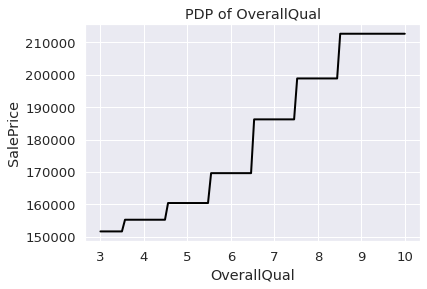

In [0]:
top_3_feature = ['OverallQual', "GrLivArea", "TotalBsmtSF"]

model = xgb_model
x_train = x_train
feature_name = 'OverallQual'
PartialDependencePlot(model, x_train, feature_name)

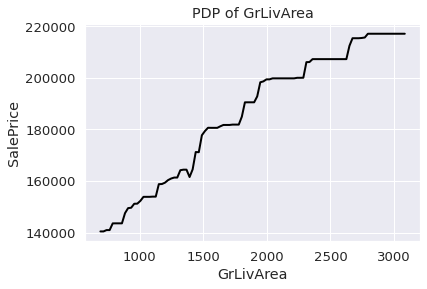

In [0]:
model = xgb_model
x_train = x_train
feature_name = 'GrLivArea'
PartialDependencePlot(model, x_train, feature_name)

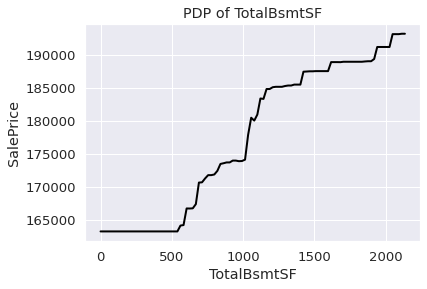

In [0]:
model = xgb_model
x_train = x_train
feature_name = 'TotalBsmtSF'
PartialDependencePlot(model, x_train, feature_name)

# 6. Model Testing

As XGBoost model has the smallest CV RMSE, here we apply the XGBoost model to fit the test data.

## 6.1 Benchmark Model Testing

In [0]:
#Loading Training Data
trainDF = stand_trainDF
y_train = trainDF.toPandas().log_saleprice
x_train = trainDF.drop('log_saleprice','SalePrice').toPandas()

#Loading Testing Data 
x_test = stand_testDF.toPandas()

#Model Fitting & Testing
from math import exp

best_knn = KNeighborsRegressor(n_neighbors = 10, weights = "distance", algorithm = "auto")
best_knn.fit(x_train, y_train)
knn_pred = best_knn.predict(x_test)

pred_lst = []
for y in knn_pred:
    value = exp(y)
    pred_lst.append(value)

knn_result = pd.DataFrame(columns=['ID', 'SalePrice'])
knn_result.SalePrice = pred_lst
knn_result.ID = list(range(1461, 2920))

display(knn_result)

ID,SalePrice
1461,115552.6305118702
1462,156773.66362275832
1463,209618.5607571429
1464,216651.4529574488
1465,183844.22274163834
1466,183488.7493417668
1467,183308.6608639162
1468,184908.48597878075
1469,193255.05793754006
1470,126150.9282613723


By uploading the test result to Kaggle, the KNN model scores 0.1764. We will take it as a benchmark score for further model comparison.

## 6.2 Developed Model Testing

In [0]:
#Loading Testing Data
testDF = test_newDF

#Model Testing
from pyspark.sql.functions import col, exp
predDF_xgb_test = pipelineModel.transform(testDF)
expDF_xgb = predDF_xgb_test.withColumn("prediction", exp(col("prediction")))
xgb_result = expDF_xgb.select('prediction').toPandas()
xgb_result['Id'] = list(range(1461,2920))
xgb_result = xgb_result[['Id','prediction']]
xgb_result.columns = (['Id', 'SalePrice'])
display(xgb_result)

Id,SalePrice
1461,118143.4774089847
1462,165474.59413721575
1463,183118.79202447366
1464,187271.02812816834
1465,175919.14585221207
1466,171488.3973360384
1467,169738.6322677363
1468,167783.5173243743
1469,177814.67973899536
1470,124181.18604296997


By uploading the test result to Kaggle, the XGB model scores 0.1258, which is much greater comparing the KNN model.

In addition, as SVR also have relatively small RMSE, we also apply it to test data.

(However, it gives out a relatively low kaggle score: 0.154. Overfitting issue may occur )

In [0]:
testDF = stand_testDF
x_test= testDF.toPandas()

svr_result = pd.DataFrame(columns=['ID', 'SalePrice'])
svr_result.SalePrice = np.exp(svr_grid_search.best_estimator_.predict(x_test))
svr_result.ID = list(range(1461, 2920))

display(svr_result)

ID,SalePrice
1461,121318.65064766182
1462,136624.73622772386
1463,168976.31295905643
1464,191359.15662330535
1465,190910.21490822622
1466,165740.58731803644
1467,183943.69797215686
1468,154760.07875376093
1469,193278.64360475744
1470,107622.78095628272
